In [92]:
import pandas as pd
import numpy as np
import os
import scipy as sp
from scipy.stats import gaussian_kde
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
data = pd.read_csv("regression_project_data.csv")

In [4]:
data

,id,x1,x2,x3,x4,x5,x6,y,x7,x8,x9,x10,x11,x12,x13,x14,x15
0,1,Los_Angeles,CA,4060,8863164,32.1,9.7,23677,27700,688936,70.0,22.3,11.6,8.0,20786,184230,4
1,2,Cook,IL,946,5105067,29.2,12.4,15153,21550,436936,73.4,22.8,11.1,7.2,21729,110928,2
2,3,Harris,TX,1729,2818199,31.3,7.1,7553,12449,253526,74.9,25.4,12.5,5.7,19517,55003,3
3,4,San_Diego,CA,4205,2498016,33.5,10.9,5905,6179,173821,81.9,25.3,8.1,6.1,19588,48931,4
4,5,Orange,CA,790,2410556,32.6,9.2,6062,6369,144524,81.2,27.8,5.2,4.8,24400,58818,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
435,436,Hernando,FL,478,101115,16.4,30.7,98,290,4414,70.5,9.7,7.9,8.2,13919,1407,3
436,437,Martin,FL,556,100900,20.4,27.5,193,277,5081,79.7,20.3,5.0,9.8,27125,2737,3
437,438,Montgomery,TN,539,100498,35.7,7.9,87,188,6537,77.9,16.5,10.8,8.0,13169,1323,3
438,439,Maui,HI,1159,100374,26.2,11.3,192,182,7130,77.0,17.8,5.7,3.2,18504,1857,4


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440 entries, 0 to 439
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   id      440 non-null    int64  
 1   x1      440 non-null    object 
 2   x2      440 non-null    object 
 3   x3      440 non-null    int64  
 4   x4      440 non-null    int64  
 5   x5      440 non-null    float64
 6   x6      440 non-null    float64
 7   y       440 non-null    int64  
 8   x7      440 non-null    int64  
 9   x8      440 non-null    int64  
 10  x9      440 non-null    float64
 11  x10     440 non-null    float64
 12  x11     440 non-null    float64
 13  x12     440 non-null    float64
 14  x13     440 non-null    int64  
 15  x14     440 non-null    int64  
 16  x15     440 non-null    int64  
dtypes: float64(6), int64(9), object(2)
memory usage: 58.6+ KB


In [6]:
data.describe()

,id,x3,x4,x5,x6,y,x7,x8,x9,x10,x11,x12,x13,x14,x15
count,440.000000,440.000000,4.400000e+02,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,220.500000,1041.411364,3.930109e+05,28.568409,12.169773,987.997727,1458.627273,27111.618182,77.560682,21.081136,8.720682,6.596591,18561.481818,7869.272727,2.461364
std,127.161315,1549.922081,6.019870e+05,4.191083,3.992666,1789.749540,2289.134128,58237.506385,7.015159,7.654524,4.656737,2.337924,4059.192009,12884.321463,1.033982
min,1.000000,15.000000,1.000430e+05,16.400000,3.000000,39.000000,92.000000,563.000000,46.600000,8.100000,1.400000,2.200000,8899.000000,1141.000000,1.000000
25%,110.750000,451.250000,1.390272e+05,26.200000,9.875000,182.750000,390.750000,6219.500000,73.875000,15.275000,5.300000,5.100000,16118.250000,2311.000000,2.000000
50%,220.500000,656.500000,2.172805e+05,28.100000,11.750000,401.000000,755.000000,11820.500000,77.700000,19.700000,7.900000,6.200000,17759.000000,3857.000000,3.000000
75%,330.250000,946.750000,4.360645e+05,30.025000,13.625000,1036.000000,1575.750000,26279.500000,82.400000,25.325000,10.900000,7.500000,20270.000000,8654.250000,3.000000
max,440.000000,20062.000000,8.863164e+06,49.700000,33.800000,23677.000000,27700.000000,688936.000000,92.900000,52.300000,36.300000,21.300000,37541.000000,184230.000000,4.000000


In [7]:
data.nunique()

id     440
x1     373
x2      48
x3     384
x4     440
x5     149
x6     137
y      360
x7     391
x8     437
x9     223
x10    220
x11    155
x12     97
x13    436
x14    428
x15      4
dtype: int64

In [8]:
data.dtypes

id       int64
x1      object
x2      object
x3       int64
x4       int64
x5     float64
x6     float64
y        int64
x7       int64
x8       int64
x9     float64
x10    float64
x11    float64
x12    float64
x13      int64
x14      int64
x15      int64
dtype: object

## Univariate Analysis

### Variable X15

In [9]:
## This is categorical variable with 4 unique values 
## Converting this column into categorical
data["x15"]=pd.Categorical(data.x15)

In [10]:
data["x15"].dtypes

CategoricalDtype(categories=[1, 2, 3, 4], ordered=False)

In [11]:
data['x15'].value_counts()

3    152
2    108
1    103
4     77
Name: x15, dtype: int64

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


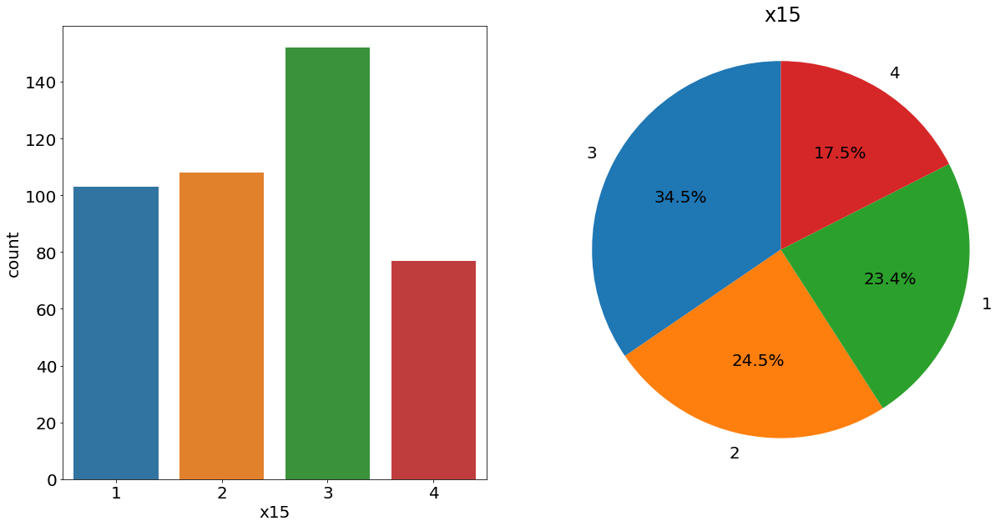

In [12]:
plt.subplots(figsize=(20, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
sns.countplot(data['x15'])

plt.subplot(1, 2, 2)
plt.pie(list(data['x15'].value_counts()), labels=[3,2,1,4], autopct='%1.1f%%', startangle=90, radius=2.)
plt.title('x15')
plt.axis('equal')
plt.show()

Category with value 3 has highest count which accounts for 34.5%.

### Variable X14

In [13]:
data["x14"].dtypes

dtype('int64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x14'>

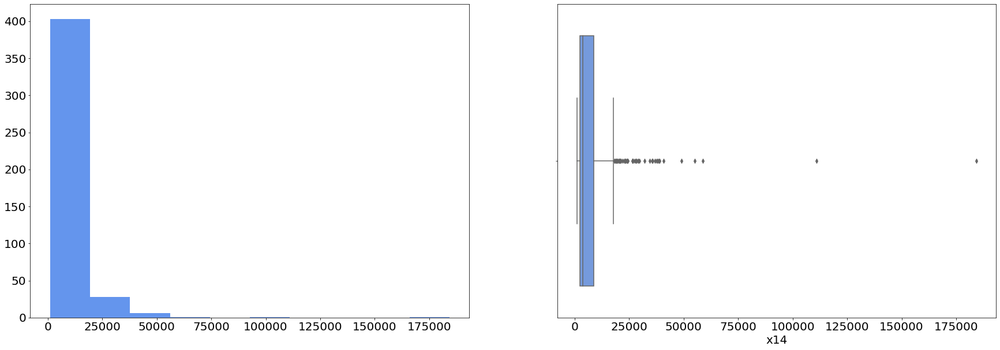

In [14]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x14'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x14'], color="cornflowerblue")

We can notice that x14 is positively skewed and many outliers are present in the data.

### Variable X13

In [15]:
data["x13"].dtypes

dtype('int64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x13'>

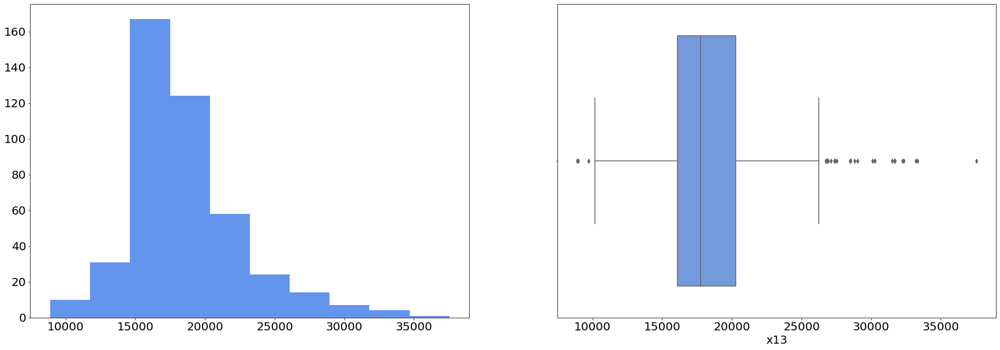

In [16]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x13'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x13'], color="cornflowerblue")

### Variable X12

In [17]:
data["x12"].dtypes

dtype('float64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x12'>

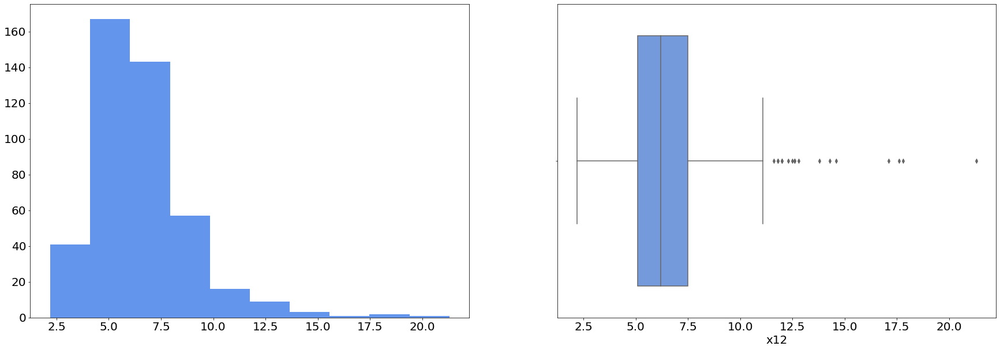

In [18]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x12'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x12'], color="cornflowerblue")

### Variable X11

In [19]:
data["x11"].dtypes

dtype('float64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x11'>

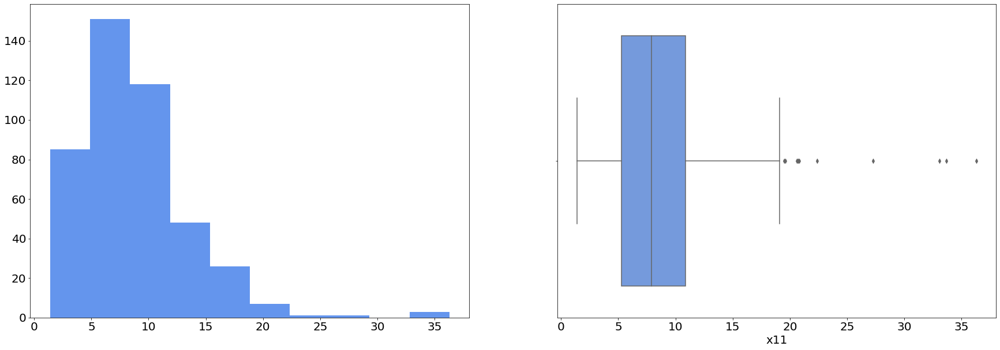

In [20]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x11'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x11'], color="cornflowerblue")

### Variable X10

In [51]:
data["x10"].dtypes

dtype('float64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x10'>

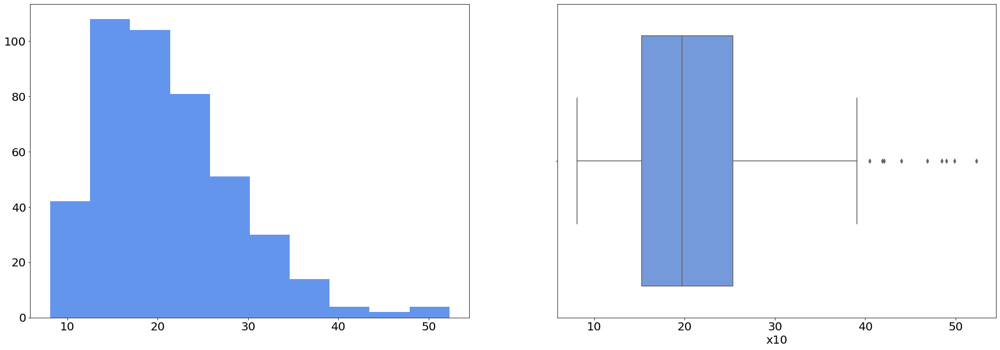

In [52]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x10'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x10'], color="cornflowerblue")

### Variable X9

In [53]:
data["x9"].dtypes

dtype('float64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x9'>

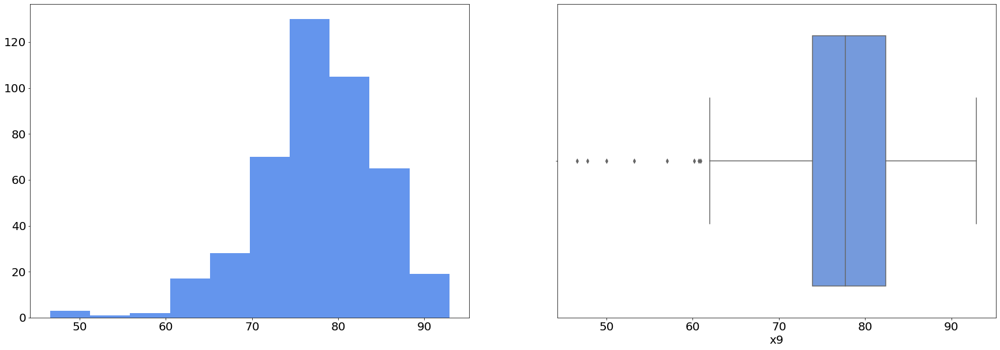

In [55]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x9'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x9'], color="cornflowerblue")

### Variable X8

In [56]:
data["x8"].dtypes

dtype('int64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x8'>

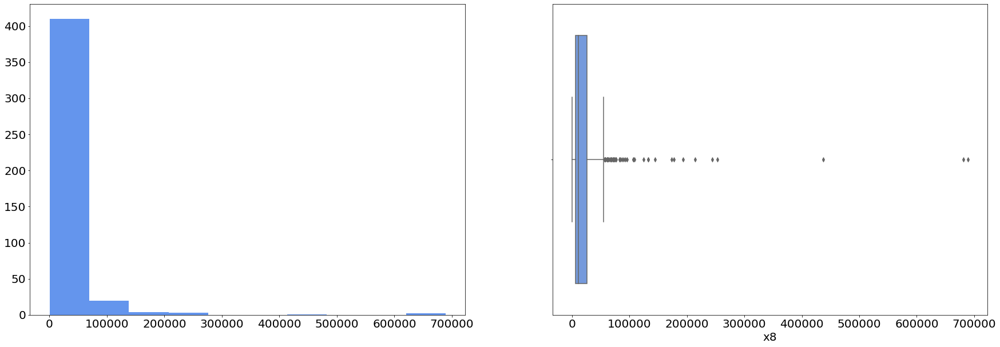

In [57]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x8'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x8'], color="cornflowerblue")

### Variable X7

In [58]:
data["x7"].dtypes

dtype('int64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x7'>

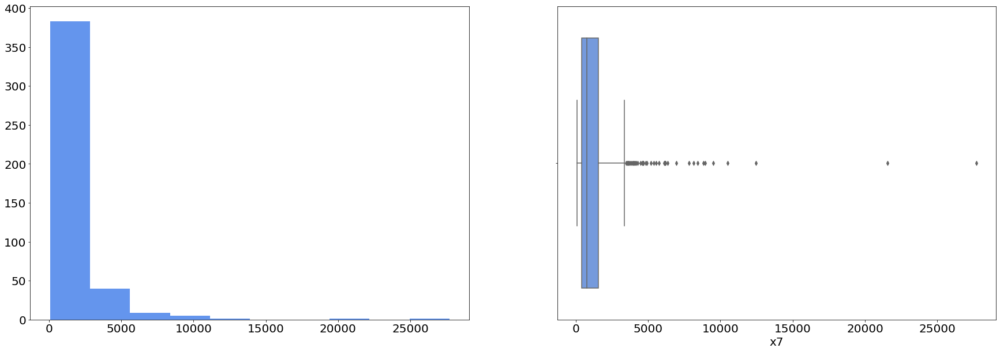

In [60]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x7'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x7'], color="cornflowerblue")

### Variable X6

In [62]:
data["x6"].dtypes

dtype('float64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x6'>

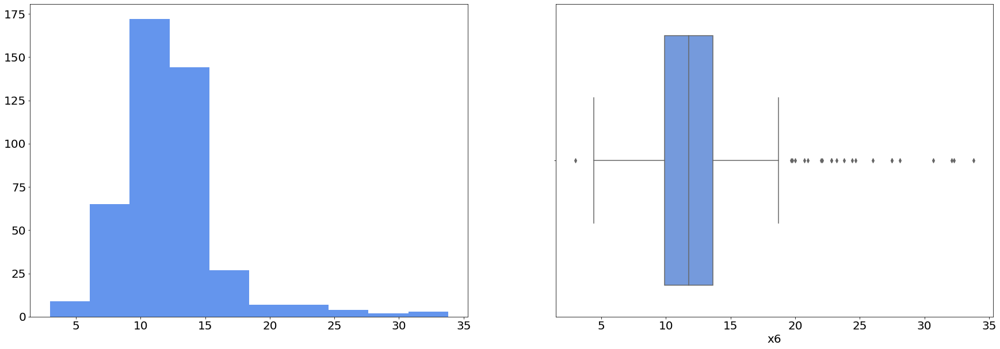

In [63]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x6'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x6'], color="cornflowerblue")

### Variable X5

In [64]:
data["x5"].dtypes

dtype('float64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x5'>

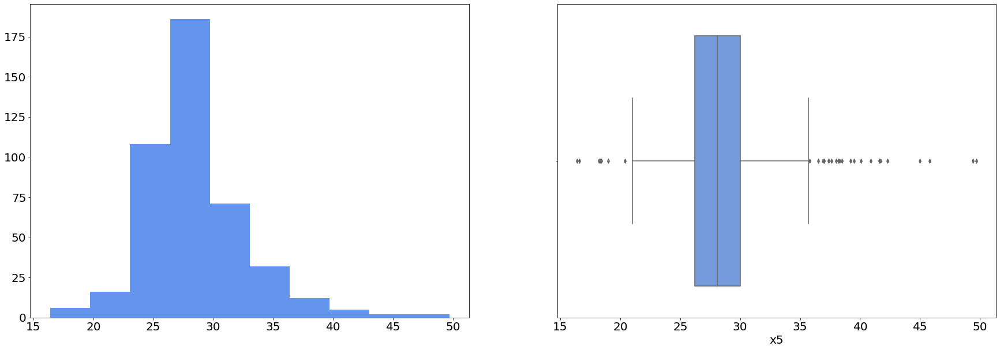

In [65]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x5'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x5'], color="cornflowerblue")

### Variable X4

In [66]:
data["x4"].dtypes

dtype('int64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x4'>

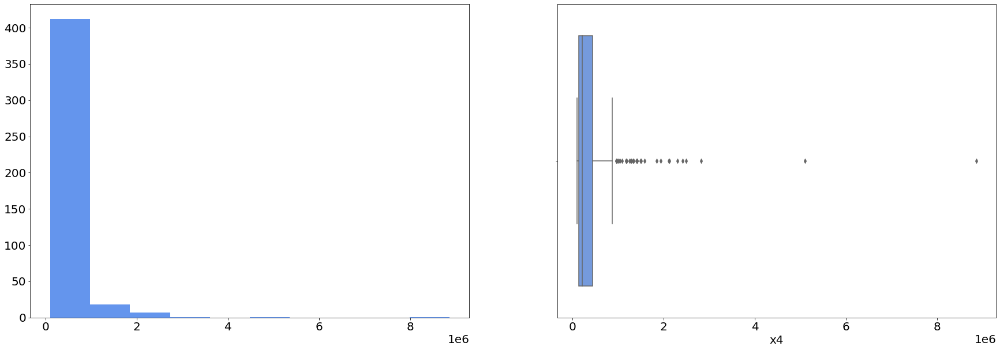

In [67]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x4'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x4'], color="cornflowerblue")

### Variable X3

In [69]:
data["x3"].dtypes

dtype('int64')

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='x3'>

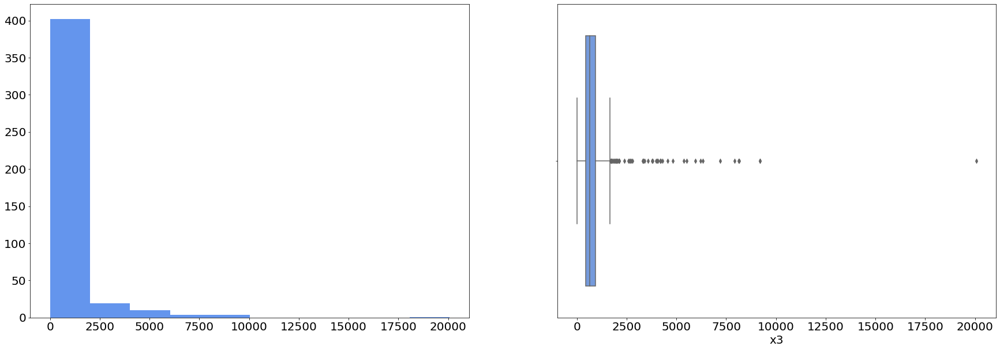

In [71]:
plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.hist(data['x3'], color="cornflowerblue")

plt.subplot(1, 2, 2)
sns.boxplot(data['x3'], color="cornflowerblue")

## Bivariate Analysis

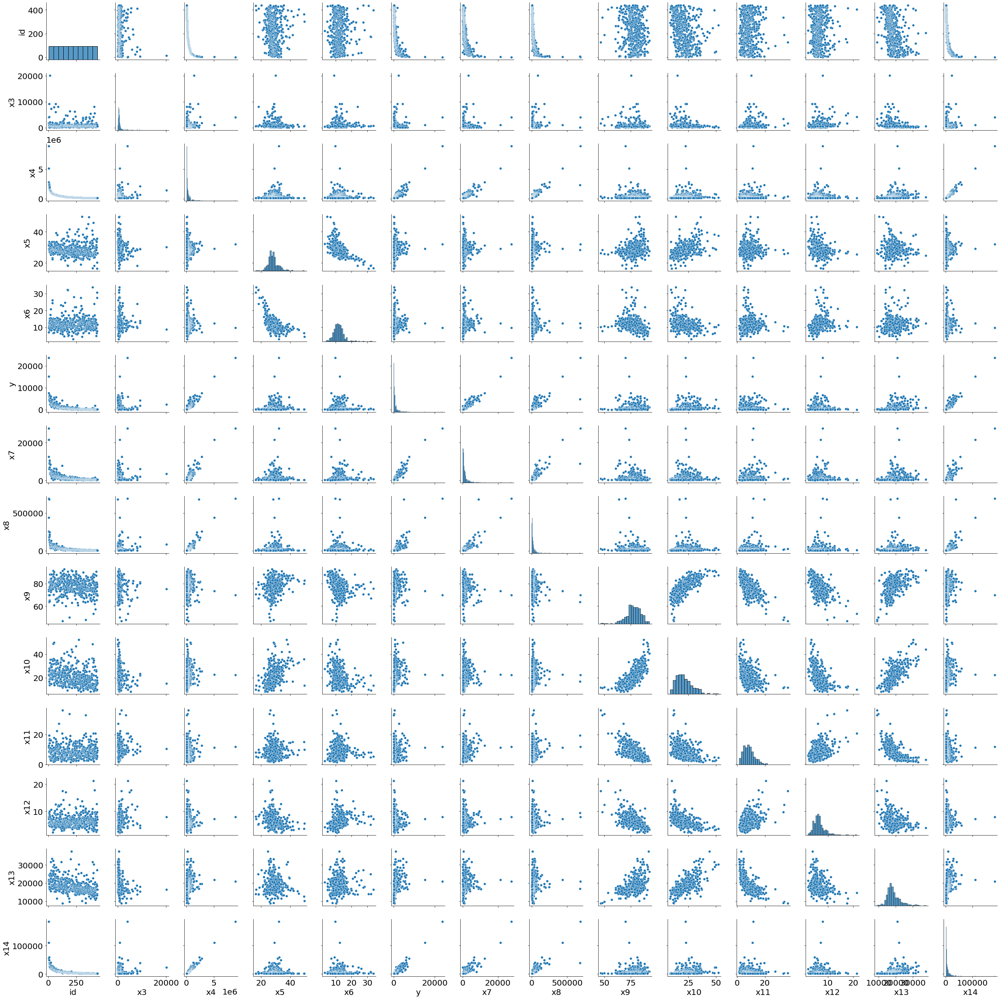

In [21]:
sns.pairplot(data, palette= "cornflowerblue")

/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/759049750.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mat = data.corr()


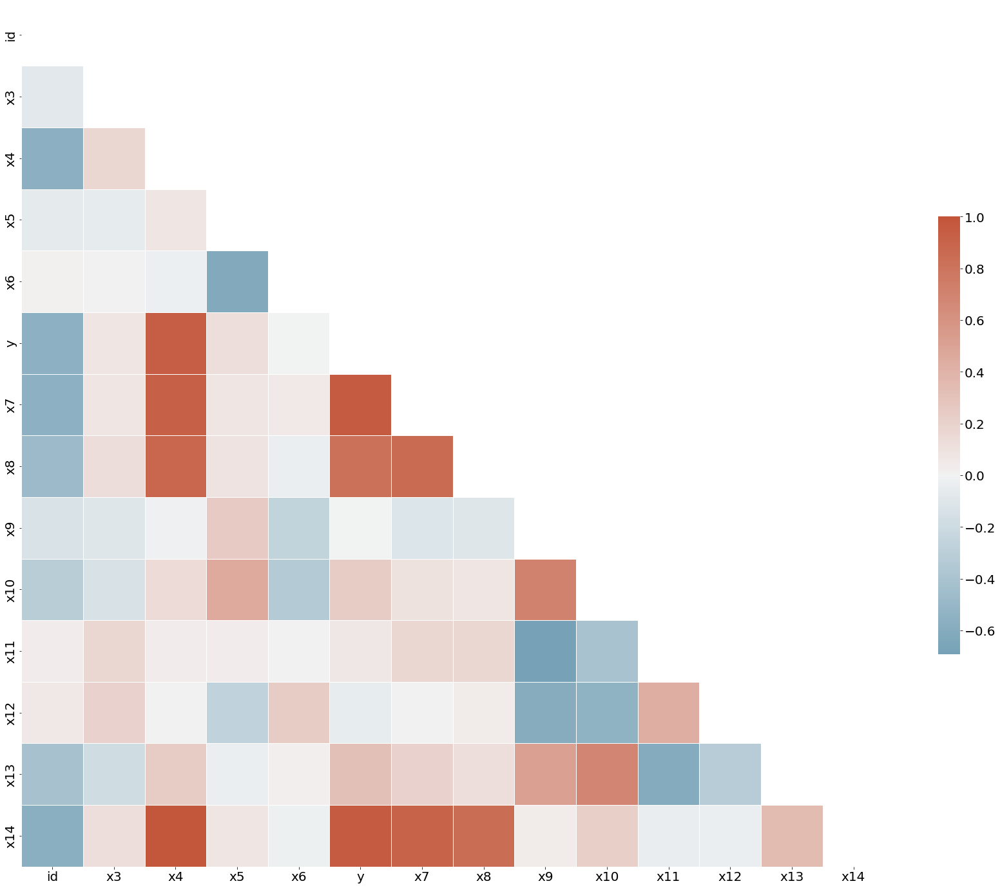

In [22]:
fig, ax = plt.subplots(figsize=(30,25))
mat = data.corr()
mask = np.triu(np.ones_like(mat, dtype=bool))
cmap = sns.diverging_palette(230,20, as_cmap= True)
sns.heatmap(mat, mask=mask, cmap=cmap, vmax=1, center=0, square = True, linewidth= 0.5, cbar_kws= {"shrink":0.5})
plt.show()

Y is highly correlated with X4, X7, X8 and X14.

Only x15 seems to be categorical column with 4 categories.

### Bivariate Analysis of Continuous vs Categorical Variables

In [23]:
#Check the mean hp for each vs 
data.groupby(by="x15").mean()

/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2999215772.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data.groupby(by="x15").mean()


,id,x3,x4,x5,x6,y,x7,x8,x9,x10,x11,x12,x13,x14
x15,,,,,,,,,,,,,,
1,200.378641,655.514563,395834.524272,27.968932,13.641748,1094.466019,1508.097087,23086.029126,77.568932,21.784466,6.528155,7.166019,20598.766990,8734.155340
2,244.194444,633.074074,346171.564815,28.515741,11.656481,860.416667,1477.648148,21780.740741,79.359259,19.775000,7.903704,6.332407,18301.092593,6835.583333
3,233.144737,726.618421,329003.894737,29.205921,11.973026,821.131579,1352.269737,26990.973684,75.198684,21.043421,10.570395,6.194079,17486.986842,6129.980263
4,189.220779,2751.753247,581282.181818,28.185714,11.309091,1353.922078,1575.727273,40211.727273,79.689610,22.046753,9.148052,7.000000,18322.584416,11595.610390


In [25]:
data.groupby(by="x15")["y"].mean()

x15
1    1094.466019
2     860.416667
3     821.131579
4    1353.922078
Name: y, dtype: float64

<AxesSubplot:xlabel='y', ylabel='Density'>

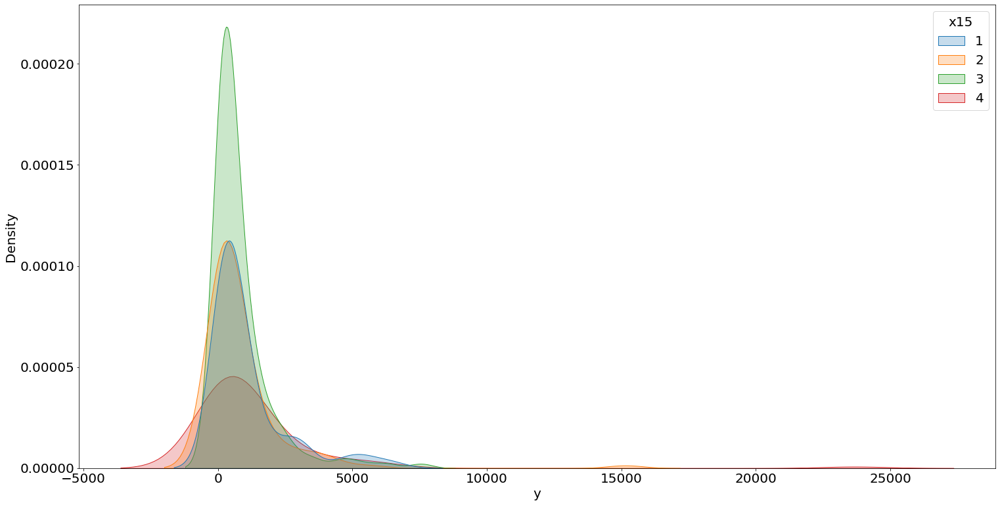

In [43]:
## categorical Density plot of y against x15
fig= plt.subplots( figsize=(25, 13))
sns.kdeplot(data=data,x="y",hue="x15" ,fill=True)

In [46]:
data["x15"].dtype

CategoricalDtype(categories=[1, 2, 3, 4], ordered=False)

<AxesSubplot:xlabel='x6', ylabel='Density'>

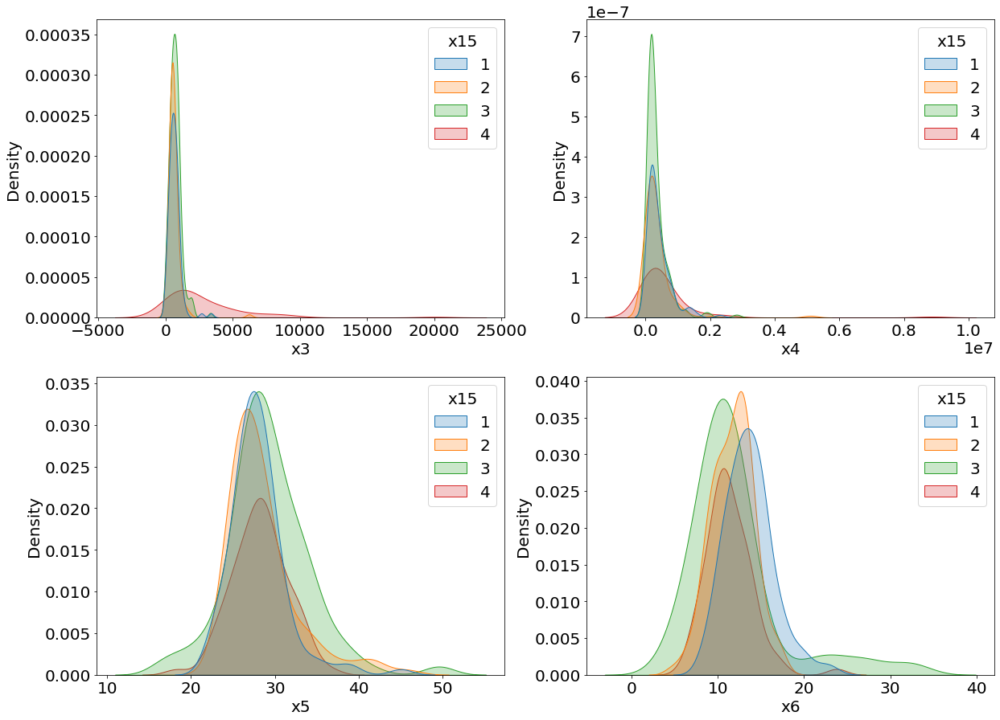

In [47]:
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sns.kdeplot(data=data,x="x3",hue="x15" ,fill=True,ax=axs[0,0])
sns.kdeplot(data=data,x="x4",hue="x15" ,fill=True,ax=axs[0,1])
sns.kdeplot(data=data,x="x5",hue="x15" ,fill=True,ax=axs[1,0])
sns.kdeplot(data=data,x="x6",hue="x15" ,fill=True,ax=axs[1,1])

<AxesSubplot:xlabel='x10', ylabel='Density'>

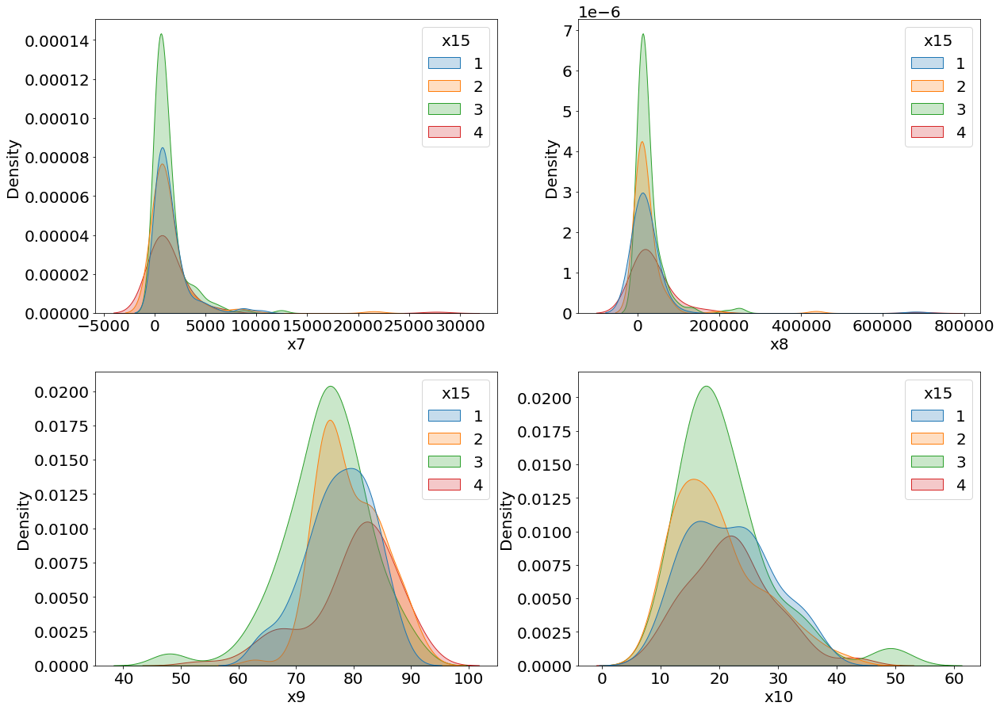

In [48]:
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sns.kdeplot(data=data,x="x7",hue="x15" ,fill=True,ax=axs[0,0])
sns.kdeplot(data=data,x="x8",hue="x15" ,fill=True,ax=axs[0,1])
sns.kdeplot(data=data,x="x9",hue="x15" ,fill=True,ax=axs[1,0])
sns.kdeplot(data=data,x="x10",hue="x15" ,fill=True,ax=axs[1,1])

<AxesSubplot:xlabel='x14', ylabel='Density'>

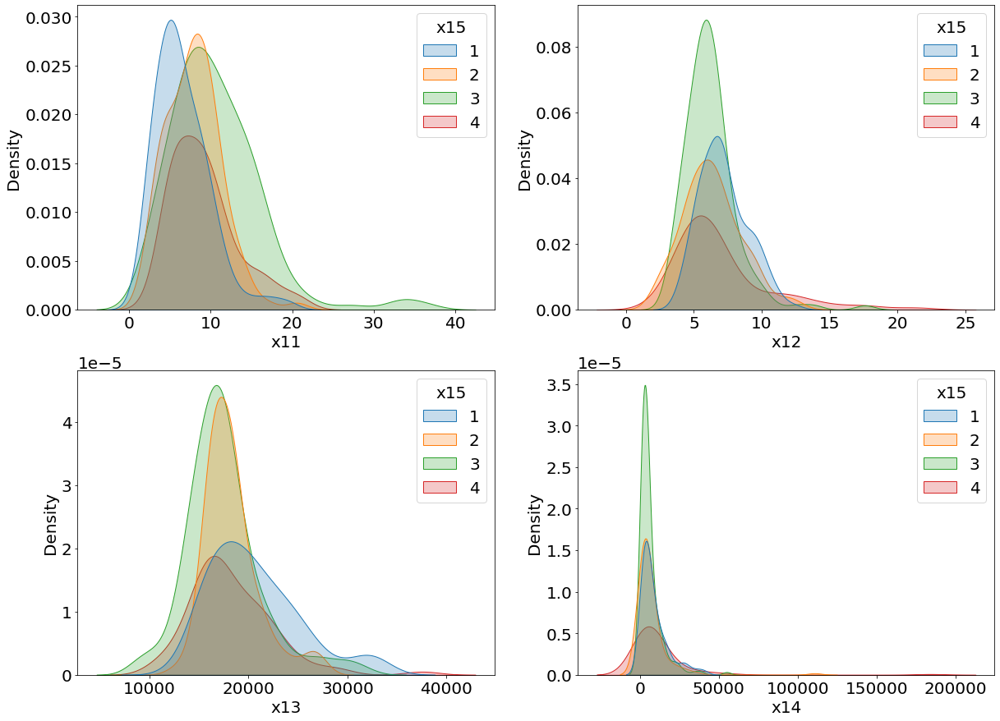

In [49]:
fig, axs = plt.subplots(2, 2, figsize=(20, 15))

sns.kdeplot(data=data,x="x11",hue="x15" ,fill=True,ax=axs[0,0])
sns.kdeplot(data=data,x="x12",hue="x15" ,fill=True,ax=axs[0,1])
sns.kdeplot(data=data,x="x13",hue="x15" ,fill=True,ax=axs[1,0])
sns.kdeplot(data=data,x="x14",hue="x15" ,fill=True,ax=axs[1,1])

### Multivarite analysis

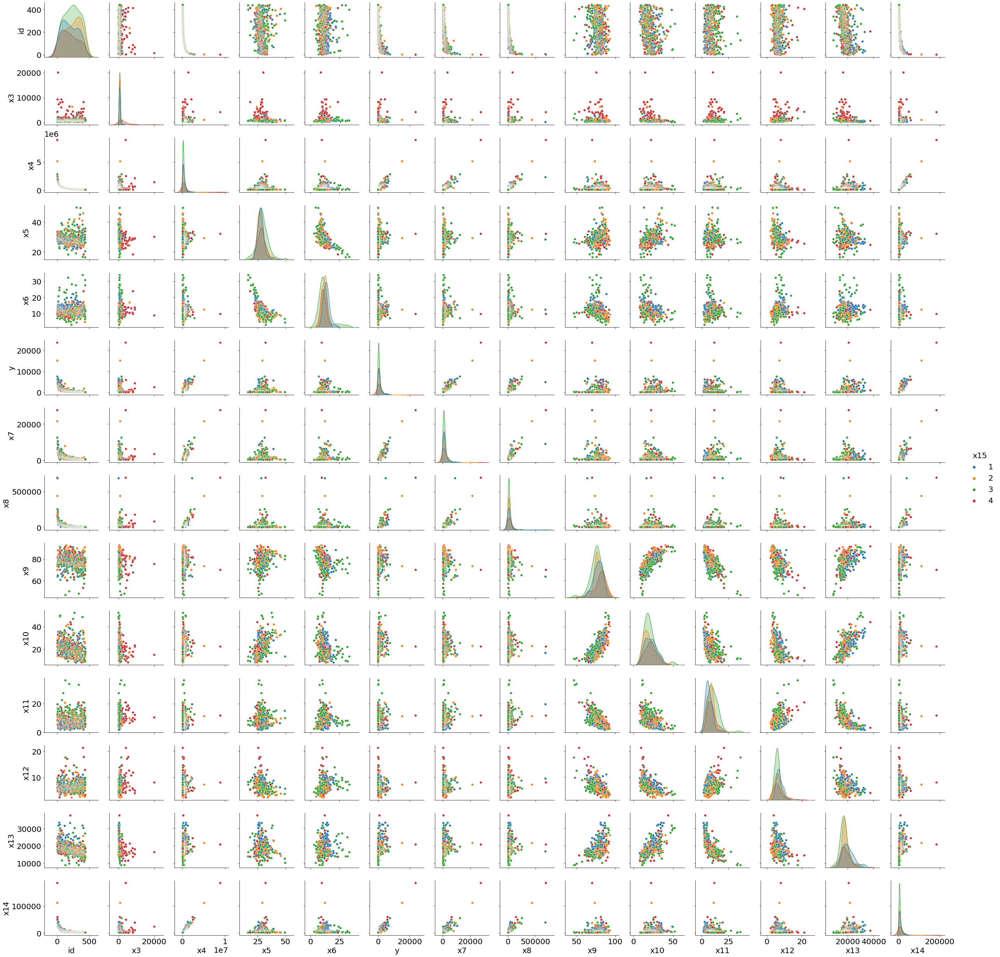

In [50]:
sns.pairplot(data,hue="x15")

## Univariate Regression

### Y on x3

In [304]:
#fit simple linear regression model
X = data['x3']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.006
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     2.686
Date:                Sun, 02 Apr 2023   Prob (F-statistic):              0.102
Time:                        00:42:51   Log-Likelihood:                -3918.0
No. Observations:                 440   AIC:                             7840.
Df Residuals:                     438   BIC:                             7848.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        894.1087    102.634      8.712      0.0

/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/3137713385.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_xticklabels(b.get_xticks(), size = 15)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/3137713385.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 15)


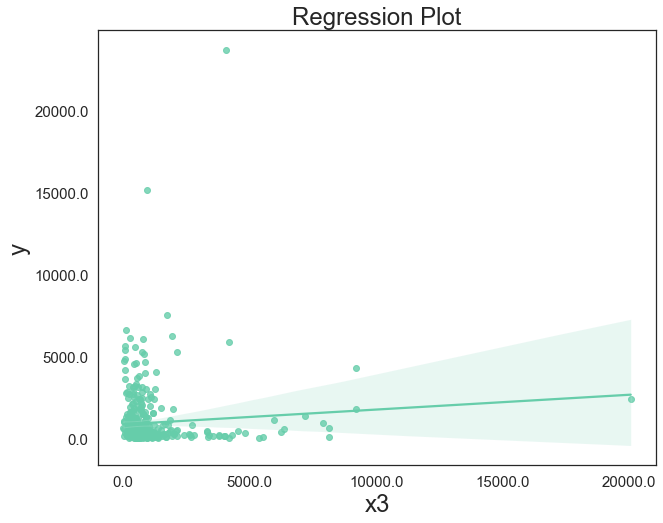

In [305]:
fig,axs= plt.subplots(figsize=(10,8))
sns.set_style("white")
b=sns.regplot(x=data['x3'], y=data['y'], data=data, color= "mediumaquamarine")
b.set_xticklabels(b.get_xticks(), size = 15)
b.set_yticklabels(b.get_yticks(), size = 15)
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


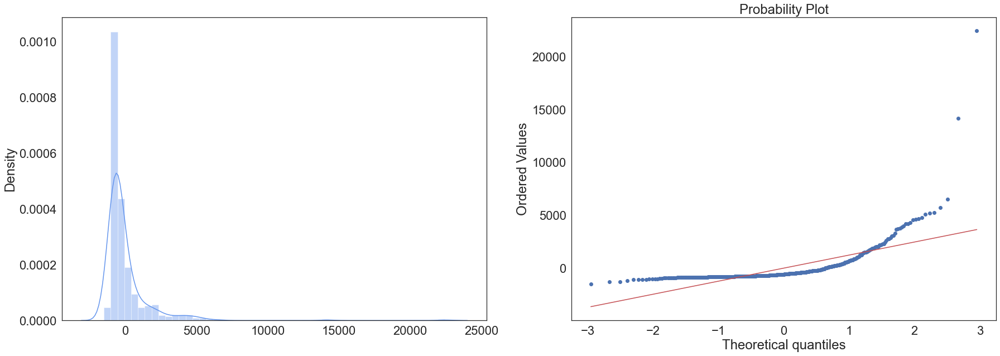

Text(0.5, 1.0, 'Residual plot')

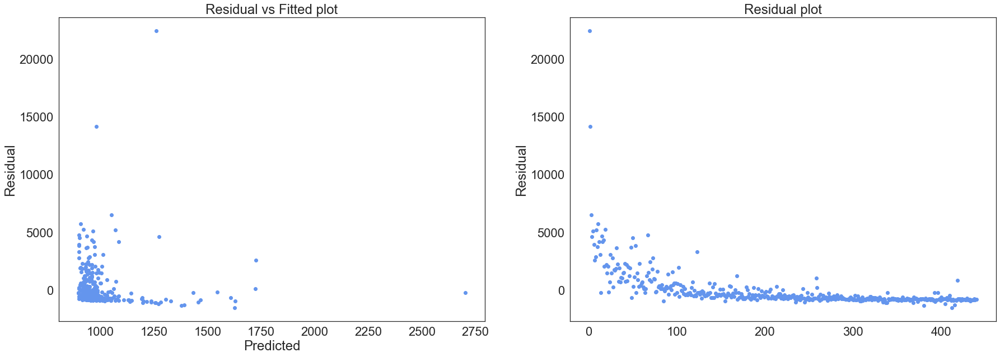

In [306]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue" )
plt.xlabel("Predicted")
plt.ylabel("Residual")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.scatter(range(1,441),residuals, color="cornflowerblue")
plt.ylabel("Residual")
plt.title("Residual plot")

### Y on x4

In [301]:
#fit simple linear regression model
X = data['x4']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.884
Model:                            OLS   Adj. R-squared:                  0.884
Method:                 Least Squares   F-statistic:                     3340.
Date:                Sun, 02 Apr 2023   Prob (F-statistic):          4.66e-207
Time:                        00:42:17   Log-Likelihood:                -3445.3
No. Observations:                 440   AIC:                             6895.
Df Residuals:                     438   BIC:                             6903.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -110.6348     34.746     -3.184      0.0

/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/2284749981.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_xticklabels(b.get_xticks(), size = 15)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/2284749981.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 15)


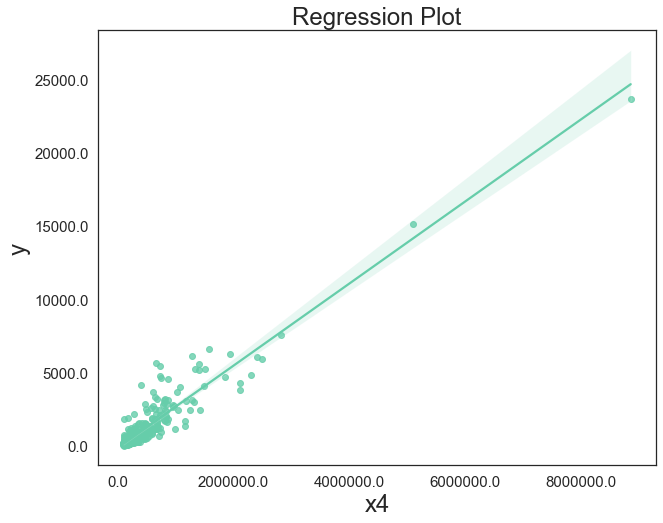

In [302]:
fig,axs= plt.subplots(figsize=(10,8))
sns.set_style("white")
b=sns.regplot(x=data['x4'], y=data['y'], data=data, color= "mediumaquamarine")
b.set_xticklabels(b.get_xticks(), size = 15)
b.set_yticklabels(b.get_yticks(), size = 15)
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


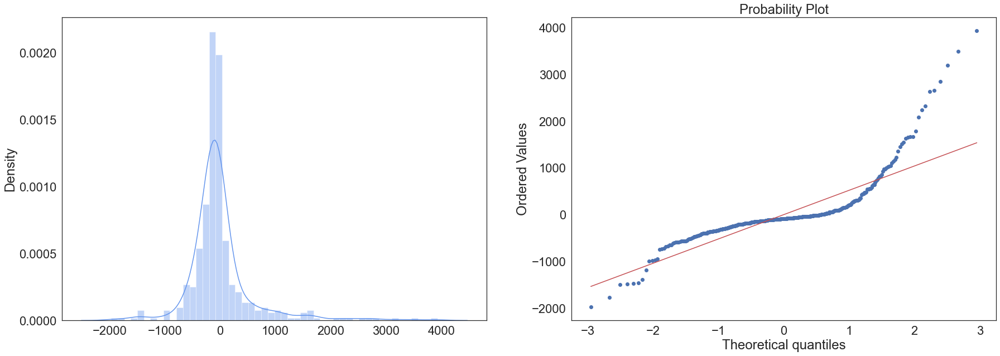

Text(0.5, 1.0, 'Residual plot')

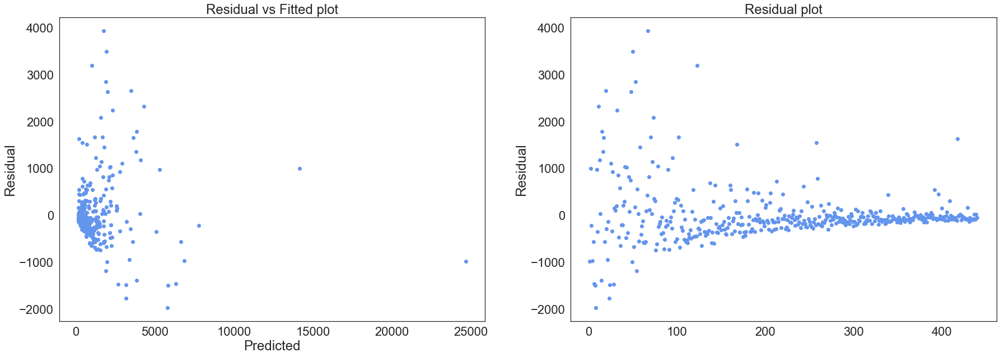

In [303]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.xlabel("Predicted")
plt.ylabel("Residual")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.scatter(range(1,441),residuals, color="cornflowerblue")
plt.ylabel("Residual")
plt.title("Residual plot")

### Y on x5

In [275]:
#fit simple linear regression model
X = data['x5']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     6.367
Date:                Sat, 01 Apr 2023   Prob (F-statistic):             0.0120
Time:                        22:52:44   Log-Likelihood:                -3916.2
No. Observations:                 440   AIC:                             7836.
Df Residuals:                     438   BIC:                             7845.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -472.3070    584.918     -0.807      0.4

/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/2700350369.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_xticklabels(b.get_xticks(), size = 15)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/2700350369.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 15)


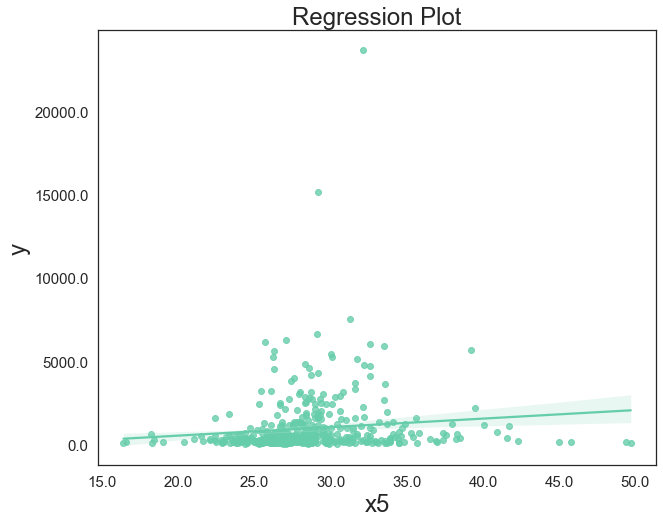

In [276]:
fig,axs= plt.subplots(figsize=(10,8))
sns.set_style("white")
b=sns.regplot(x=data['x5'], y=data['y'], data=data, color= "mediumaquamarine")
b.set_xticklabels(b.get_xticks(), size = 15)
b.set_yticklabels(b.get_yticks(), size = 15)
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


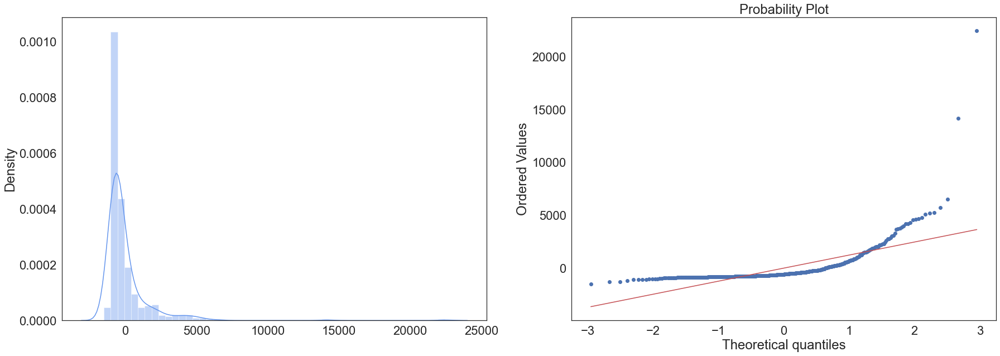

Text(0.5, 1.0, 'Residual plot')

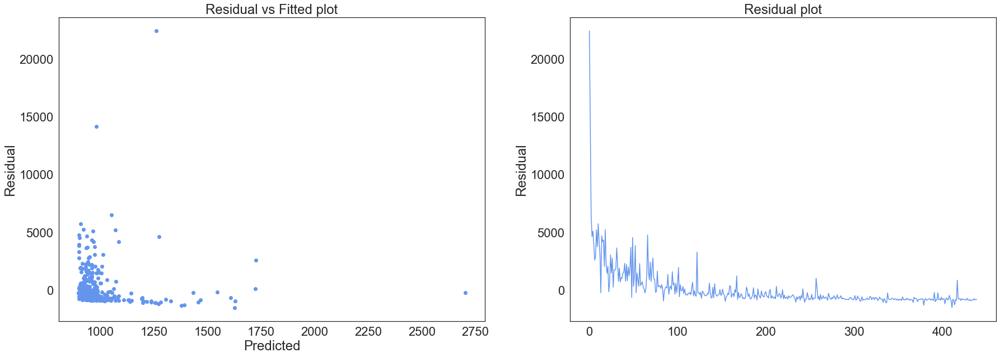

In [298]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.xlabel("Predicted")
plt.ylabel("Residual")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals, color="cornflowerblue")
plt.ylabel("Residual")
plt.title("Residual plot")

### Y on x6

In [272]:
#fit simple linear regression model
X = data['x6']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                  0.004287
Date:                Sat, 01 Apr 2023   Prob (F-statistic):              0.948
Time:                        22:50:25   Log-Likelihood:                -3919.4
No. Observations:                 440   AIC:                             7843.
Df Residuals:                     438   BIC:                             7851.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1005.0651    274.298      3.664      0.0

/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/2356803593.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_xticklabels(b.get_xticks(), size = 15)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/2356803593.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 15)


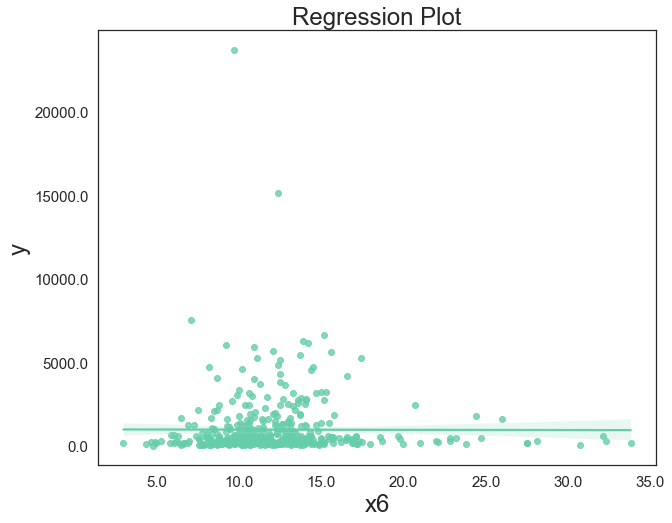

In [273]:
fig,axs= plt.subplots(figsize=(10,8))
sns.set_style("white")
b=sns.regplot(x=data['x6'], y=data['y'], data=data, color= "mediumaquamarine")
b.set_xticklabels(b.get_xticks(), size = 15)
b.set_yticklabels(b.get_yticks(), size = 15)
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


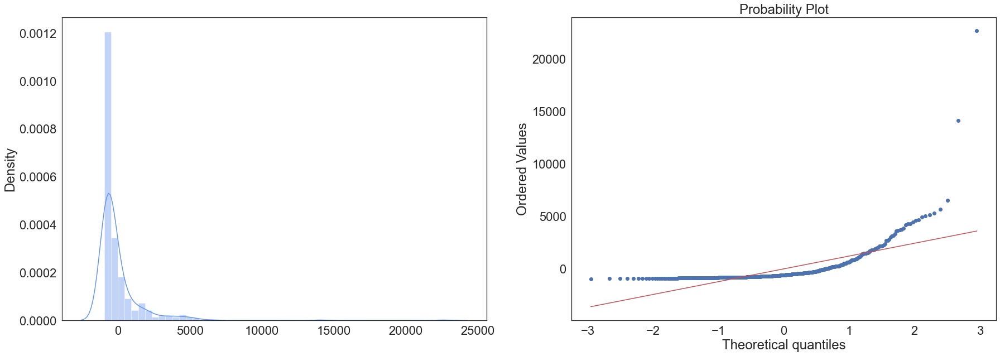

Text(0.5, 1.0, 'Residual plot')

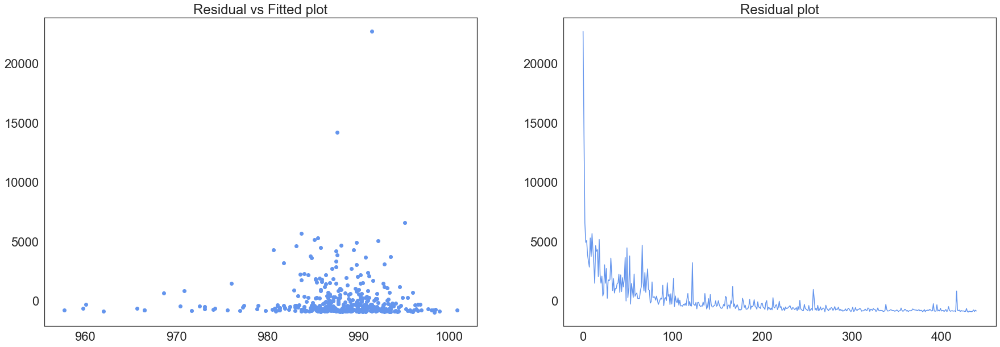

In [274]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals, color="cornflowerblue")
plt.title("Residual plot")

### Y on x7

In [269]:
#fit simple linear regression model
X = data['x7']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.903
Model:                            OLS   Adj. R-squared:                  0.903
Method:                 Least Squares   F-statistic:                     4095.
Date:                Sat, 01 Apr 2023   Prob (F-statistic):          2.14e-224
Time:                        22:48:27   Log-Likelihood:                -3405.2
No. Observations:                 440   AIC:                             6814.
Df Residuals:                     438   BIC:                             6823.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -95.9322     31.494     -3.046      0.0

/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/4179713217.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_xticklabels(b.get_xticks(), size = 15)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/4179713217.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 15)


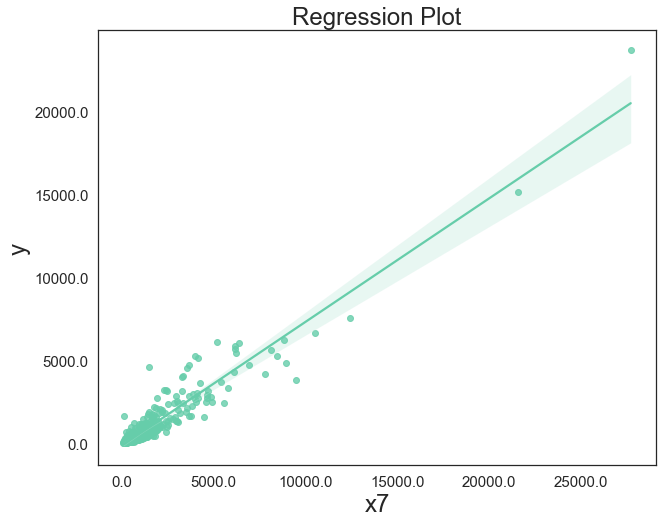

In [270]:
fig,axs= plt.subplots(figsize=(10,8))
sns.set_style("white")
b=sns.regplot(x=data['x7'], y=data['y'], data=data, color= "mediumaquamarine")
b.set_xticklabels(b.get_xticks(), size = 15)
b.set_yticklabels(b.get_yticks(), size = 15)
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


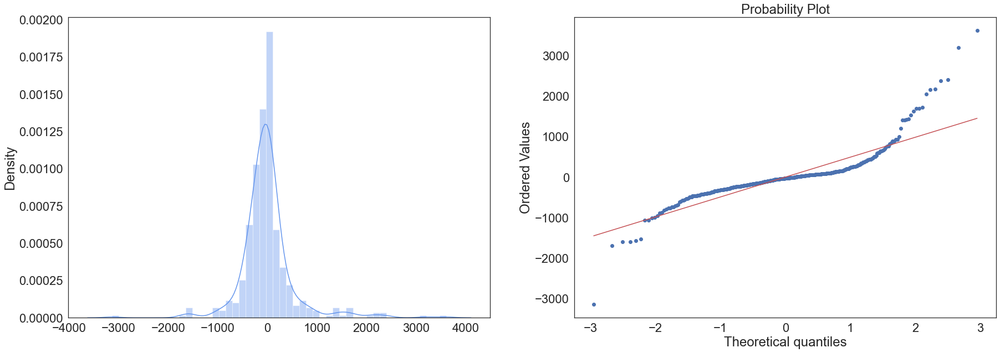

Text(0.5, 1.0, 'Residual plot')

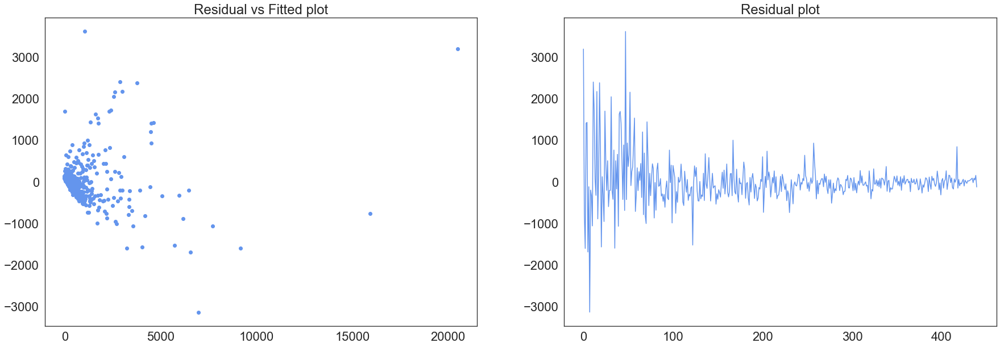

In [271]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals, color="cornflowerblue")
plt.title("Residual plot")

### Y on x8

In [248]:
#fit simple linear regression model
X = data['x8']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.673
Model:                            OLS   Adj. R-squared:                  0.672
Method:                 Least Squares   F-statistic:                     902.1
Date:                Sat, 01 Apr 2023   Prob (F-statistic):          2.03e-108
Time:                        22:41:50   Log-Likelihood:                -3673.3
No. Observations:                 440   AIC:                             7351.
Df Residuals:                     438   BIC:                             7359.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        304.3977     53.879      5.650      0.0

/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/3698652435.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_xticklabels(b.get_xticks(), size = 15)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/3698652435.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 15)


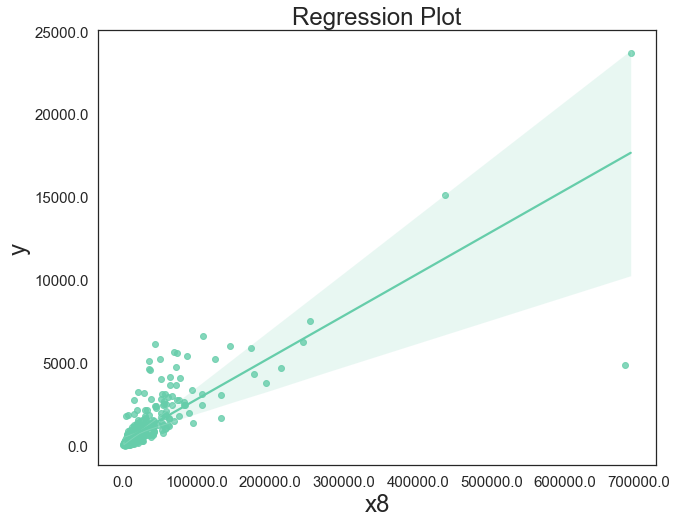

In [267]:
fig,axs= plt.subplots(figsize=(10,8))
sns.set_style("white")
b=sns.regplot(x=data['x8'], y=data['y'], data=data, color= "mediumaquamarine")
b.set_xticklabels(b.get_xticks(), size = 15)
b.set_yticklabels(b.get_yticks(), size = 15)
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


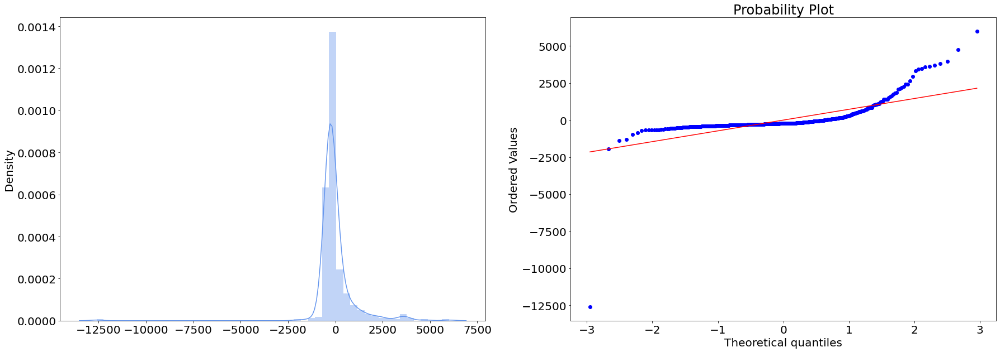

Text(0.5, 1.0, 'Residual plot')

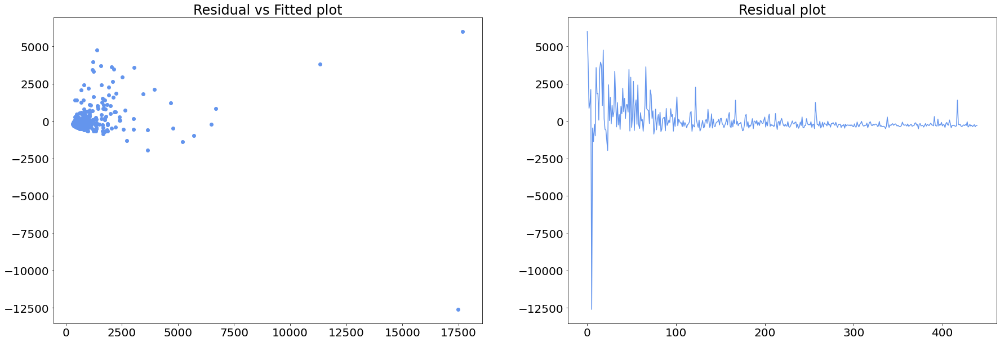

In [250]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals, color="cornflowerblue")
plt.title("Residual plot")

### Y on x9

In [245]:
#fit simple linear regression model
X = data['x9']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                  0.007904
Date:                Sat, 01 Apr 2023   Prob (F-statistic):              0.929
Time:                        22:39:03   Log-Likelihood:                -3919.4
No. Observations:                 440   AIC:                             7843.
Df Residuals:                     438   BIC:                             7851.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1072.0577    949.337      1.129      0.2

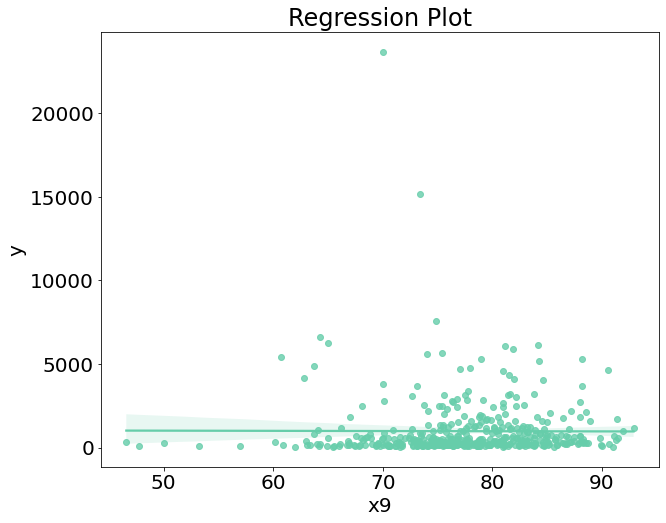

In [246]:
fig,axs= plt.subplots(figsize=(10,8))
sns.regplot(x=data['x9'], y=data['y'], data=data, color= "mediumaquamarine")
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


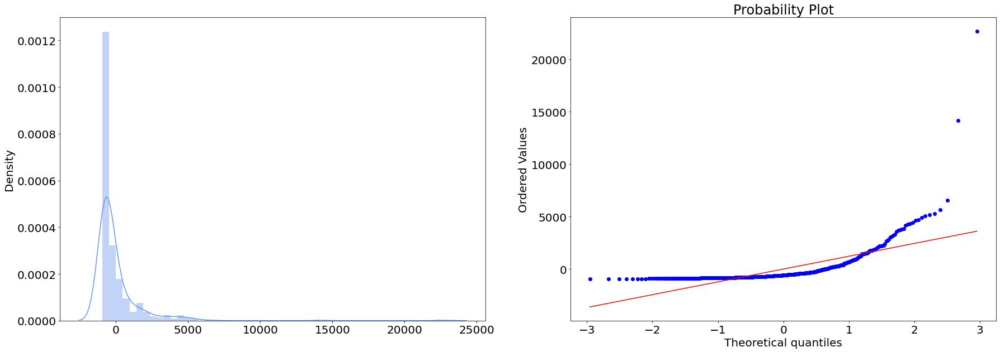

Text(0.5, 1.0, 'Residual plot')

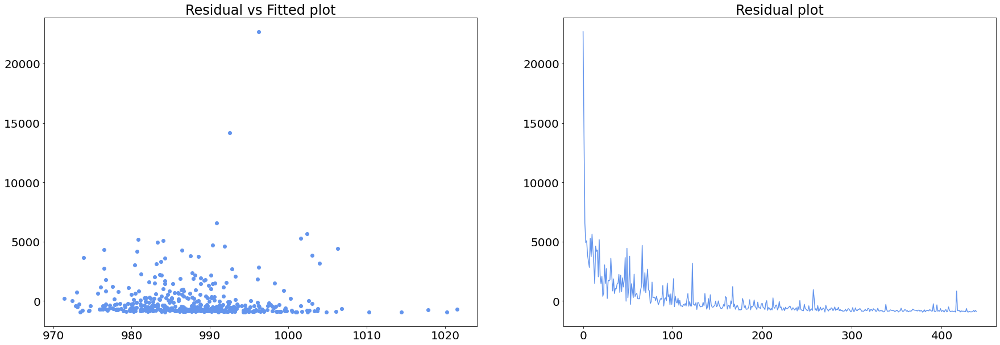

In [247]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals, color="cornflowerblue")
plt.title("Residual plot")

### Y on x10

In [195]:
#fit simple linear regression model
X = data['x10']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.056
Model:                            OLS   Adj. R-squared:                  0.054
Method:                 Least Squares   F-statistic:                     26.01
Date:                Sat, 01 Apr 2023   Prob (F-statistic):           5.06e-07
Time:                        22:23:43   Log-Likelihood:                -3906.7
No. Observations:                 440   AIC:                             7817.
Df Residuals:                     438   BIC:                             7826.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -179.0442    243.410     -0.736      0.4

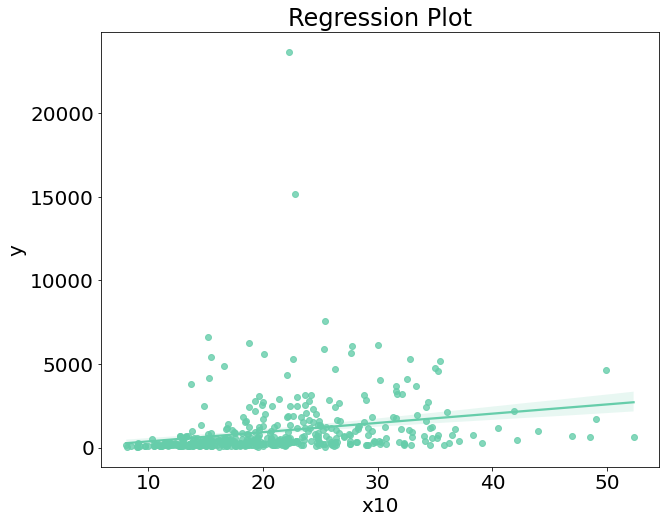

In [196]:
fig,axs= plt.subplots(figsize=(10,8))
sns.regplot(x=data['x10'], y=data['y'], data=data, color= "mediumaquamarine")
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


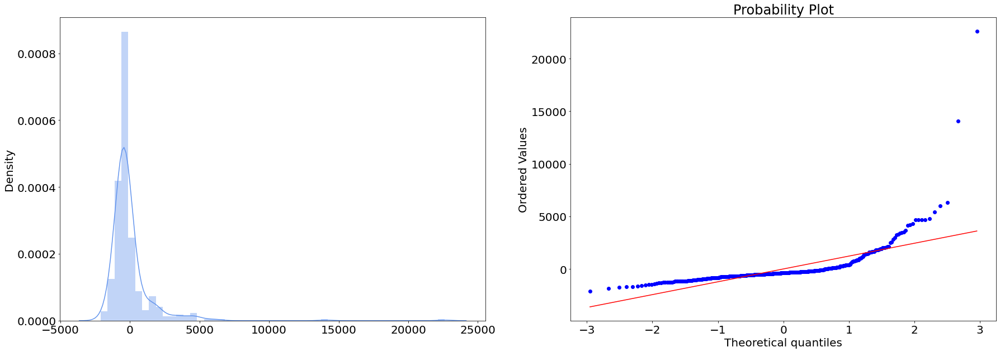

Text(0.5, 1.0, 'Residual plot')

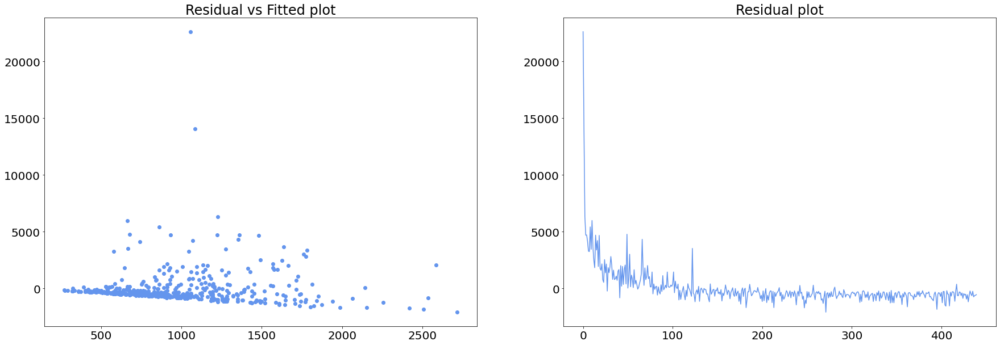

In [197]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals, color="cornflowerblue")
plt.title("Residual plot")

### Y on x11

In [207]:
#fit simple linear regression model
X = data['x11']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.809
Date:                Sat, 01 Apr 2023   Prob (F-statistic):              0.179
Time:                        22:29:17   Log-Likelihood:                -3918.5
No. Observations:                 440   AIC:                             7841.
Df Residuals:                     438   BIC:                             7849.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        773.0343    181.132      4.268      0.0

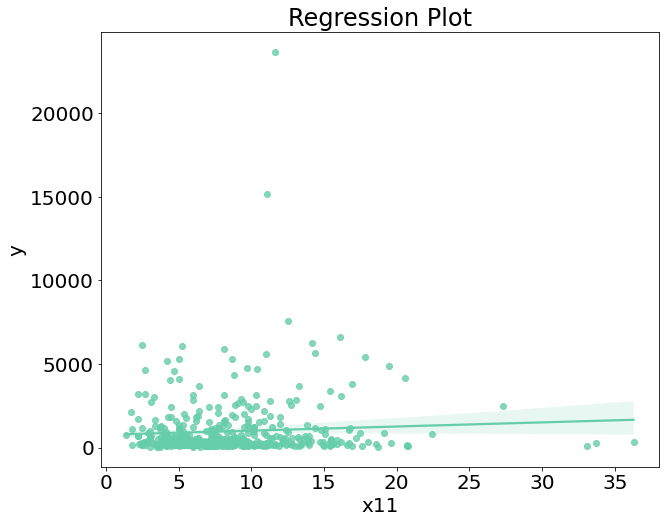

In [208]:
fig,axs= plt.subplots(figsize=(10,8))
sns.regplot(x=data['x11'], y=data['y'], data=data, color= "mediumaquamarine")
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


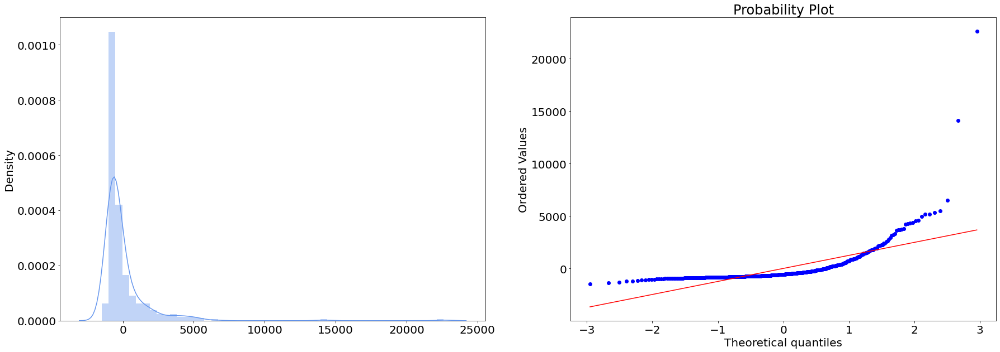

Text(0.5, 1.0, 'Residual plot')

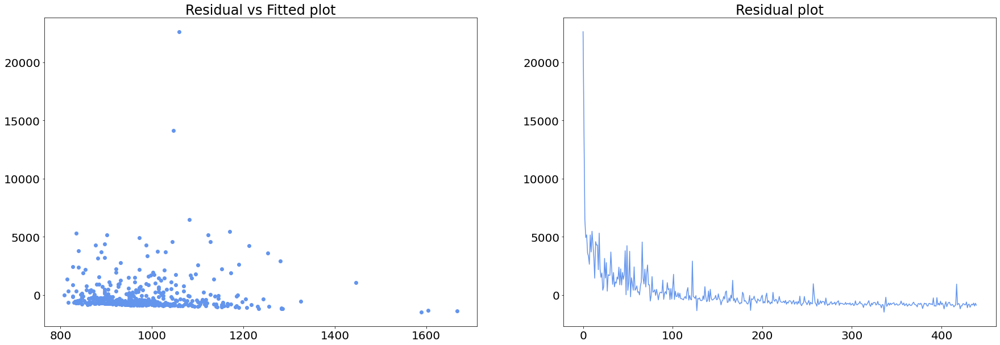

In [209]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals, color="cornflowerblue")
plt.title("Residual plot")

### Y on x12

In [202]:
#fit simple linear regression model
X = data['x12']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.121
Date:                Sat, 01 Apr 2023   Prob (F-statistic):              0.290
Time:                        22:26:15   Log-Likelihood:                -3918.8
No. Observations:                 440   AIC:                             7842.
Df Residuals:                     438   BIC:                             7850.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1243.0983    255.640      4.863      0.0

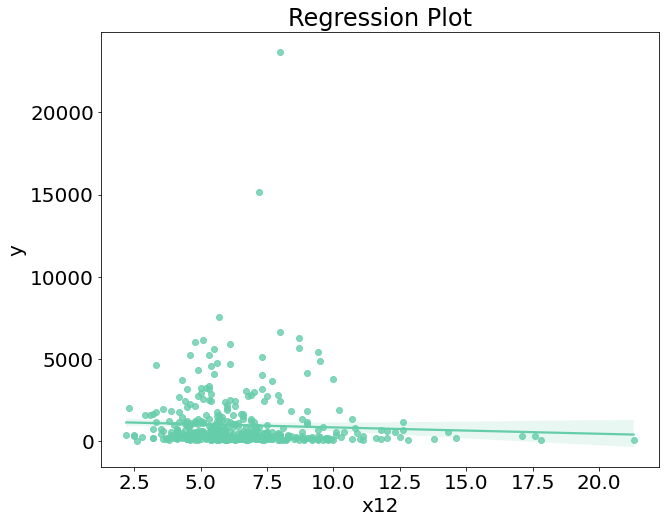

In [203]:
fig,axs= plt.subplots(figsize=(10,8))
sns.regplot(x=data['x12'], y=data['y'], data=data, color= "mediumaquamarine")
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


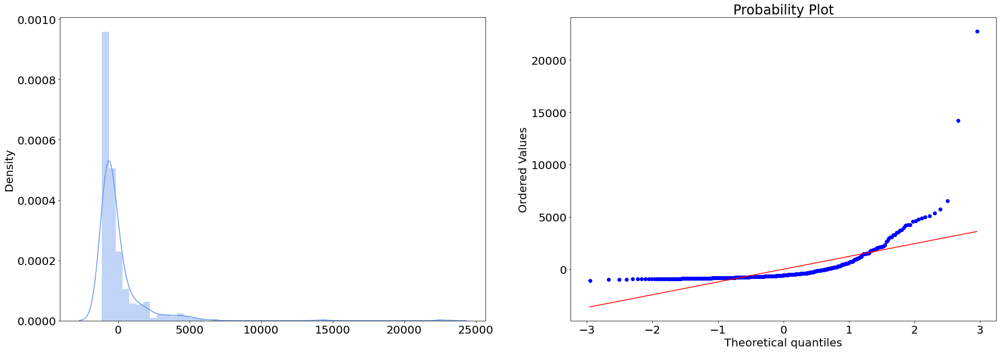

Text(0.5, 1.0, 'Residual plot')

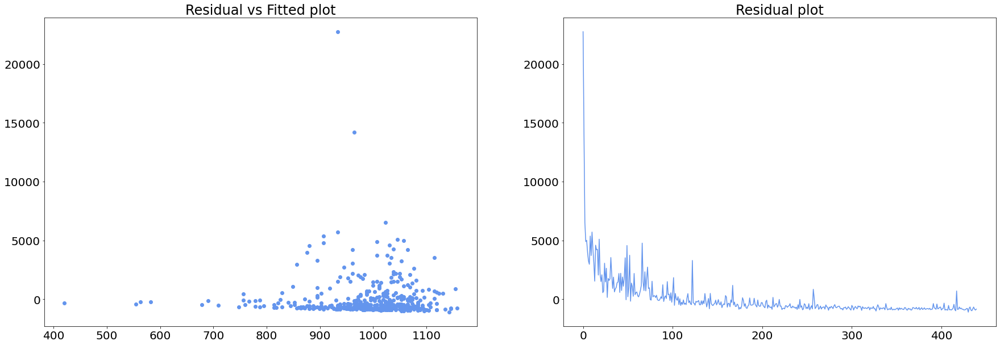

In [204]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals, color="cornflowerblue")
plt.title("Residual plot")

### Y on x13

In [212]:
#fit simple linear regression model
X = data['x13']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.100
Model:                            OLS   Adj. R-squared:                  0.098
Method:                 Least Squares   F-statistic:                     48.63
Date:                Sat, 01 Apr 2023   Prob (F-statistic):           1.14e-11
Time:                        22:30:17   Log-Likelihood:                -3896.2
No. Observations:                 440   AIC:                             7796.
Df Residuals:                     438   BIC:                             7805.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -1599.2462    379.739     -4.211      0.0

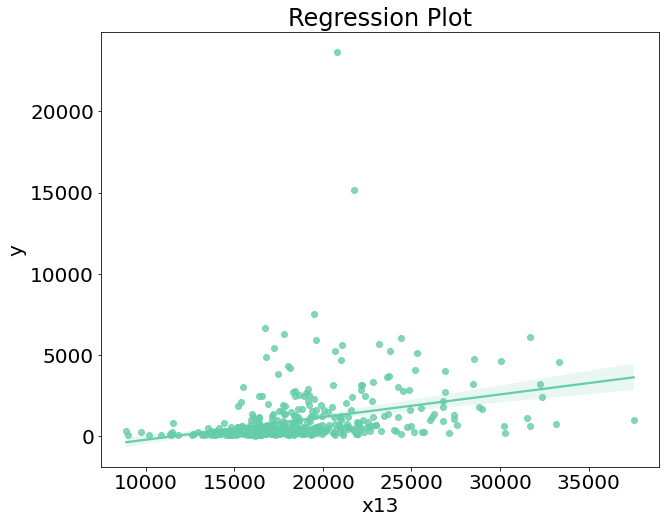

In [214]:
fig,axs= plt.subplots(figsize=(10,8))
sns.regplot(x=data['x13'], y=data['y'], data=data, color= "mediumaquamarine")
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


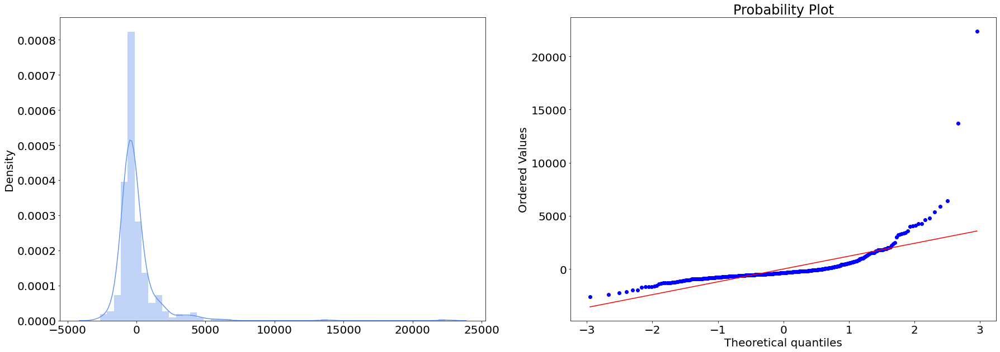

Text(0.5, 1.0, 'Residual plot')

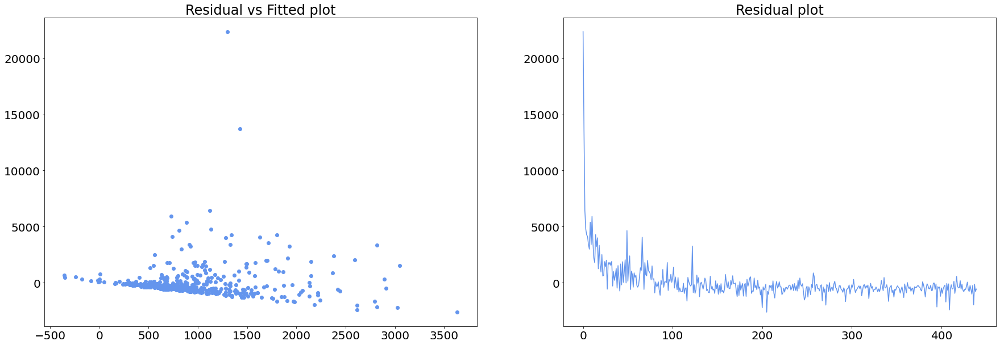

In [215]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals, color="cornflowerblue")
plt.title("Residual plot")

### Y on x14

In [235]:
#fit simple linear regression model
X = data['x14']
Y = data['y']
X = sm.add_constant(X)
model = sm.OLS(Y, X).fit()
pred = model.predict(X)
residuals = Y - model.predict(X)
summary = model.summary()
print(summary)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.899
Model:                            OLS   Adj. R-squared:                  0.899
Method:                 Least Squares   F-statistic:                     3895.
Date:                Sat, 01 Apr 2023   Prob (F-statistic):          4.28e-220
Time:                        22:36:36   Log-Likelihood:                -3415.2
No. Observations:                 440   AIC:                             6834.
Df Residuals:                     438   BIC:                             6843.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        -48.3948     31.833     -1.520      0.1

/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/1025740025.py:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_xticklabels(b.get_xticks(), size = 15)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_195/1025740025.py:4: UserWarning: FixedFormatter should only be used together with FixedLocator
  b.set_yticklabels(b.get_yticks(), size = 15)


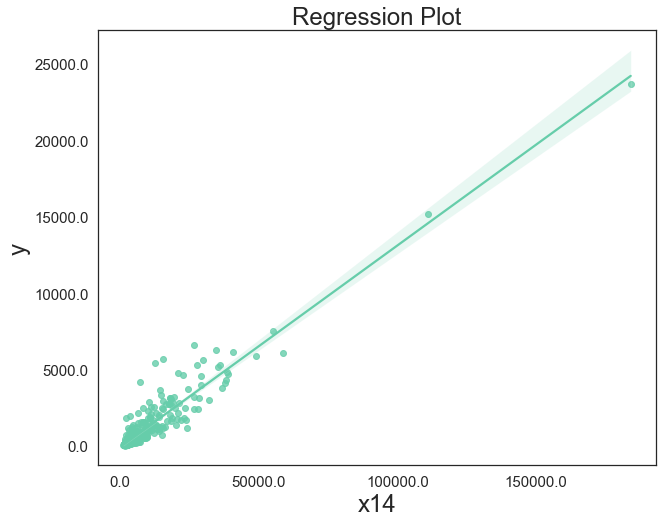

In [268]:
fig,axs= plt.subplots(figsize=(10,8))
b=sns.regplot(x=data['x14'], y=data['y'], data=data, color= "mediumaquamarine")
b.set_xticklabels(b.get_xticks(), size = 15)
b.set_yticklabels(b.get_yticks(), size = 15)
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


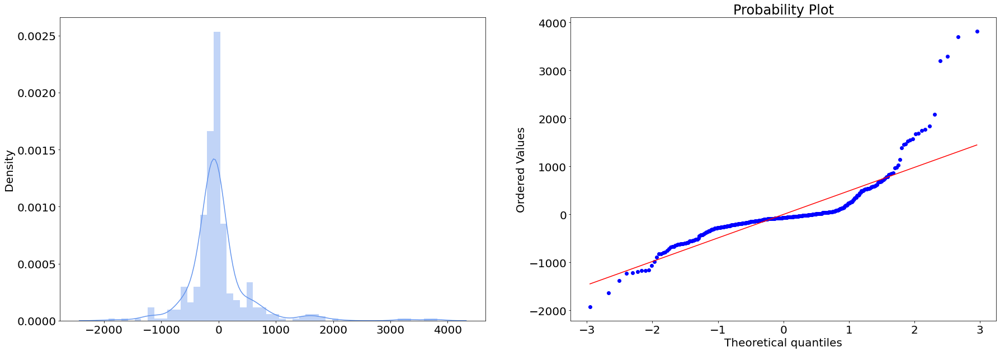

Text(0.5, 1.0, 'Residual plot')

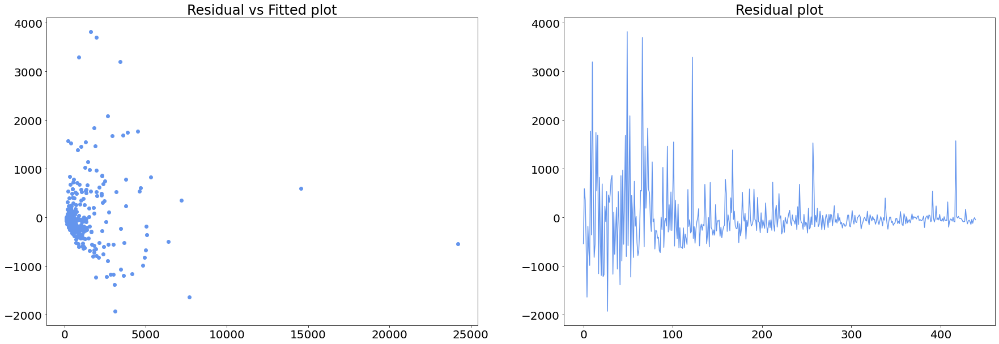

In [239]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals, ax = ax1, color="cornflowerblue")
plt.title("Residual density plot")

sp.stats.probplot(residuals,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred,residuals, color= "cornflowerblue")
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals, color="cornflowerblue")
plt.title("Residual plot")

### Y on x15

In [240]:
#fit simple linear regression model
X = data['x15'].astype('int')
Y = data['y']
X = sm.add_constant(X)
model15 = sm.OLS(Y, X).fit()
pred15 = model15.predict(X)
residuals15 = Y - model15.predict(X)
summary15 = model15.summary()
print(summary15)

                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.2662
Date:                Sat, 01 Apr 2023   Prob (F-statistic):              0.606
Time:                        22:37:20   Log-Likelihood:                -3919.2
No. Observations:                 440   AIC:                             7842.
Df Residuals:                     438   BIC:                             7851.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        882.9945    220.700      4.001      0.0

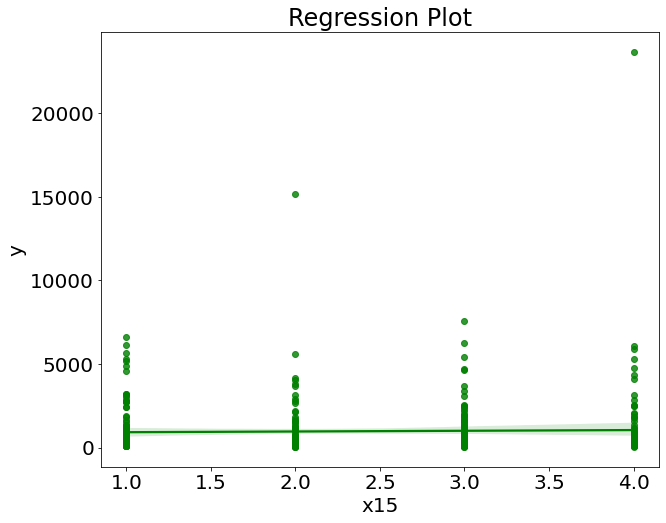

In [241]:
fig,axs= plt.subplots(figsize=(10,8))
sns.regplot(x=data['x15'].astype('int'), y=data['y'],color="g", data=data)
plt.title("Regression Plot")
plt.show()

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


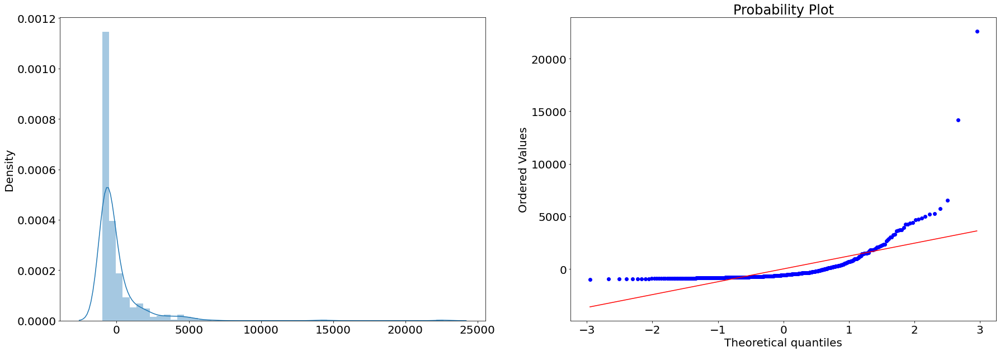

Text(0.5, 1.0, 'Residual plot')

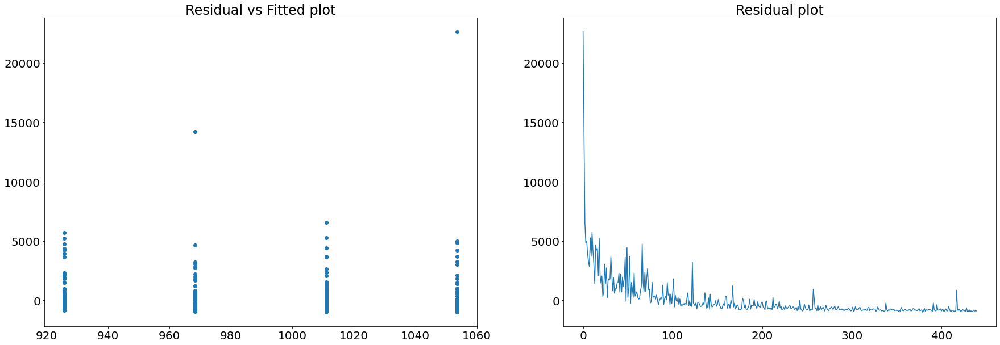

In [242]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals15, ax = ax1)
plt.title("Residual density plot")

sp.stats.probplot(residuals15,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred15,residuals15)
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals15)
plt.title("Residual plot")

In [205]:
data

,id,x1,x2,x3,x4,x5,x6,y,x7,x8,x9,x10,x11,x12,x13,x14,x15
0,1,Los_Angeles,CA,4060,8863164,32.1,9.7,23677,27700,688936,70.0,22.3,11.6,8.0,20786,184230,4
1,2,Cook,IL,946,5105067,29.2,12.4,15153,21550,436936,73.4,22.8,11.1,7.2,21729,110928,2
2,3,Harris,TX,1729,2818199,31.3,7.1,7553,12449,253526,74.9,25.4,12.5,5.7,19517,55003,3
3,4,San_Diego,CA,4205,2498016,33.5,10.9,5905,6179,173821,81.9,25.3,8.1,6.1,19588,48931,4
4,5,Orange,CA,790,2410556,32.6,9.2,6062,6369,144524,81.2,27.8,5.2,4.8,24400,58818,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
435,436,Hernando,FL,478,101115,16.4,30.7,98,290,4414,70.5,9.7,7.9,8.2,13919,1407,3
436,437,Martin,FL,556,100900,20.4,27.5,193,277,5081,79.7,20.3,5.0,9.8,27125,2737,3
437,438,Montgomery,TN,539,100498,35.7,7.9,87,188,6537,77.9,16.5,10.8,8.0,13169,1323,3
438,439,Maui,HI,1159,100374,26.2,11.3,192,182,7130,77.0,17.8,5.7,3.2,18504,1857,4


## Pre-processing

### Creating Dummy variables for x15

In [74]:
df = pd.get_dummies(data, columns = ["x15"], drop_first= True)

In [75]:
df

,id,x1,x2,x3,x4,x5,x6,y,x7,x8,x9,x10,x11,x12,x13,x14,x15_2,x15_3,x15_4
0,1,Los_Angeles,CA,4060,8863164,32.1,9.7,23677,27700,688936,70.0,22.3,11.6,8.0,20786,184230,0,0,1
1,2,Cook,IL,946,5105067,29.2,12.4,15153,21550,436936,73.4,22.8,11.1,7.2,21729,110928,1,0,0
2,3,Harris,TX,1729,2818199,31.3,7.1,7553,12449,253526,74.9,25.4,12.5,5.7,19517,55003,0,1,0
3,4,San_Diego,CA,4205,2498016,33.5,10.9,5905,6179,173821,81.9,25.3,8.1,6.1,19588,48931,0,0,1
4,5,Orange,CA,790,2410556,32.6,9.2,6062,6369,144524,81.2,27.8,5.2,4.8,24400,58818,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
435,436,Hernando,FL,478,101115,16.4,30.7,98,290,4414,70.5,9.7,7.9,8.2,13919,1407,0,1,0
436,437,Martin,FL,556,100900,20.4,27.5,193,277,5081,79.7,20.3,5.0,9.8,27125,2737,0,1,0
437,438,Montgomery,TN,539,100498,35.7,7.9,87,188,6537,77.9,16.5,10.8,8.0,13169,1323,0,1,0
438,439,Maui,HI,1159,100374,26.2,11.3,192,182,7130,77.0,17.8,5.7,3.2,18504,1857,0,0,1


### Train test split

In [806]:
X = df.drop(columns= ["y", "id", "x1", "x2"])
y = df['y']

In [807]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(
    X, y, test_size=0.4, random_state=0)

In [808]:
X_train1.shape

(264, 15)

In [809]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(
    X, y, test_size=0.3, random_state=0)

In [810]:
X_train2.shape

(308, 15)

## Subset Selection

### Subset selection for 60:40 Split

#### Subset using Adjusted R square, AIC, BIC and Mallow's Cp 

In [129]:
def fit_linear_reg(X,Y,X_full):
    #Fit linear regression model and return RSS and R squared values
    model_k = linear_model.LinearRegression(fit_intercept = True)
    model_k.fit(X,Y)
    SSEp = mean_squared_error(Y,model_k.predict(X)) * (len(Y)-X.shape[1]-1)
    R_squared = model_k.score(X,Y)
    Ad_R_squared = 1 - ( 1-model_k.score(X, Y) ) * ( len(Y) - 1 ) / ( len(Y) - X.shape[1] - 1 )
    
    Xx = sm.add_constant(X)
    modelx = sm.OLS(Y, Xx).fit()
    AIC = modelx.aic
    BIC = modelx.bic
    
    ## Mallow C_p
    model_temp = linear_model.LinearRegression(fit_intercept = True)
    model_temp.fit(X_full, Y)
    y_pred = model_temp.predict(X_full)
    mse = mean_squared_error(Y, y_pred)
    Cp = (SSEp/mse)-(len(Y)- (2*X.shape[1]))
    
    return SSEp, R_squared , Ad_R_squared, AIC, BIC, Cp

In [130]:
#Importing tqdm for the progress bar
from tqdm import tnrange, tqdm_notebook
import itertools

#Initialization variables
k = X_train1.shape[1]
SSEp_list, R_squared_list, Adj_R_squared_list,feature_list, AIC_list, BIC_list, Cp_list = [],[],[],[],[],[],[]
numb_features = []

#Looping over k = 1 to k = 11 features in X
for k in tnrange(1,len(X_train1.columns) + 1, desc = 'Loop...'):

    #Looping over all possible combinations: from 11 choose k
    for combo in itertools.combinations(X_train1.columns,k):
        tmp_result = fit_linear_reg(X_train1[list(combo)],y_train1, X_train1)   #Store temp result 
        SSEp_list.append(tmp_result[0])                  #Append lists
        R_squared_list.append(tmp_result[1])
        Adj_R_squared_list.append(tmp_result[2])
        AIC_list.append(tmp_result[3])
        BIC_list.append(tmp_result[4])
        Cp_list.append(tmp_result[5])
        feature_list.append(combo)
        numb_features.append(len(combo))   

#Store in DataFrame
Subset_df = pd.DataFrame({'features':feature_list, 'p': numb_features,'SSEp': SSEp_list, 'R_squared':R_squared_list,'Adj_R_squared':Adj_R_squared_list, 'AIC':AIC_list, 'BIC':BIC_list, 'Cp':Cp_list})

/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2492825749.py:11: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`
  for k in tnrange(1,len(X_train1.columns) + 1, desc = 'Loop...'):


Loop...:   0%|          | 0/15 [00:00<?, ?it/s]

In [131]:
Subset_df

,features,p,SSEp,R_squared,Adj_R_squared,AIC,BIC,Cp
0,"(x3,)",1,8.243990e+08,0.014190,0.010427,4703.120218,4710.272116,8530.666625
1,"(x4,)",1,6.663742e+07,0.920315,0.920011,4039.057675,4046.209574,448.724517
2,"(x5,)",1,8.244683e+08,0.014107,0.010344,4703.142403,4710.294301,8531.405544
3,"(x6,)",1,8.344606e+08,0.002158,-0.001650,4706.322761,4713.474659,8637.978684
4,"(x7,)",1,7.870238e+07,0.905888,0.905529,4082.989155,4090.141053,577.403915
...,...,...,...,...,...,...,...,...
32762,"(x3, x4, x5, x7, x8, x9, x10, x11, x12, x13, x...",14,2.336086e+07,0.970607,0.968954,3801.767107,3855.406343,13.156329
32763,"(x3, x4, x6, x7, x8, x9, x10, x11, x12, x13, x...",14,2.335043e+07,0.970620,0.968968,3801.649251,3855.288488,13.045125
32764,"(x3, x5, x6, x7, x8, x9, x10, x11, x12, x13, x...",14,2.509985e+07,0.968419,0.966643,3820.722250,3874.361486,31.703577
32765,"(x4, x5, x6, x7, x8, x9, x10, x11, x12, x13, x...",14,2.335130e+07,0.970619,0.968967,3801.659072,3855.298308,13.054390


In [161]:
Best_subset={}

Best_subset['min_SSEp'] = Subset_df[Subset_df.groupby('p')['SSEp'].transform(min) == Subset_df['SSEp']]
Best_subset['max_R2'] = Subset_df[Subset_df.groupby('p')['R_squared'].transform(max) == Subset_df['R_squared']]
Best_subset['max_adj_R2'] = Subset_df[Subset_df.groupby('p')['Adj_R_squared'].transform(max) == Subset_df['Adj_R_squared']]
Best_subset['min_AIC'] = Subset_df[Subset_df.groupby('p')['AIC'].transform(min) == Subset_df['AIC']]
Best_subset['min_BIC'] = Subset_df[Subset_df.groupby('p')['BIC'].transform(min) == Subset_df['BIC']]
Best_subset['min_Cp'] = Subset_df[Subset_df.groupby('p')['Cp'].transform(min) == Subset_df['Cp']]


In [158]:
Best_subset['min_SSEp']

,features,p,SSEp,R_squared,Adj_R_squared,AIC,BIC,Cp
11,"(x14,)",1,5.520881e+07,0.933982,0.933730,3989.387712,3996.539610,326.832106
71,"(x7, x14)",2,3.507792e+07,0.957893,0.957571,3872.659946,3883.387793,114.125242
430,"(x7, x10, x14)",3,2.962944e+07,0.964297,0.963885,3831.109268,3845.413065,58.014200
1080,"(x4, x7, x10, x14)",4,2.881280e+07,0.965147,0.964609,3826.748125,3844.627871,51.304262
3401,"(x4, x7, x10, x13, x14)",5,2.544252e+07,0.969104,0.968506,3796.928342,3818.384036,17.358379
7937,"(x4, x7, x10, x13, x14, x15_4)",6,2.477025e+07,0.969804,0.969099,3792.884118,3817.915762,12.188296
14288,"(x4, x7, x8, x10, x13, x14, x15_4)",7,2.433657e+07,0.970216,0.969402,3791.250271,3819.857864,9.562853
21228,"(x4, x7, x8, x9, x10, x13, x14, x15_4)",8,2.414259e+07,0.970338,0.969407,3792.170855,3824.354397,9.493966
26955,"(x4, x7, x8, x9, x10, x11, x13, x14, x15_4)",9,2.389447e+07,0.970527,0.969483,3792.480939,3828.240430,8.847623
30496,"(x4, x7, x8, x9, x10, x11, x13, x14, x15_2, x1...",10,2.375165e+07,0.970588,0.969425,3793.939669,3833.275109,9.324371


In [182]:
Best_subset['max_adj_R2'].loc[Best_subset['max_adj_R2']['Adj_R_squared'].idxmax()]['p']

9

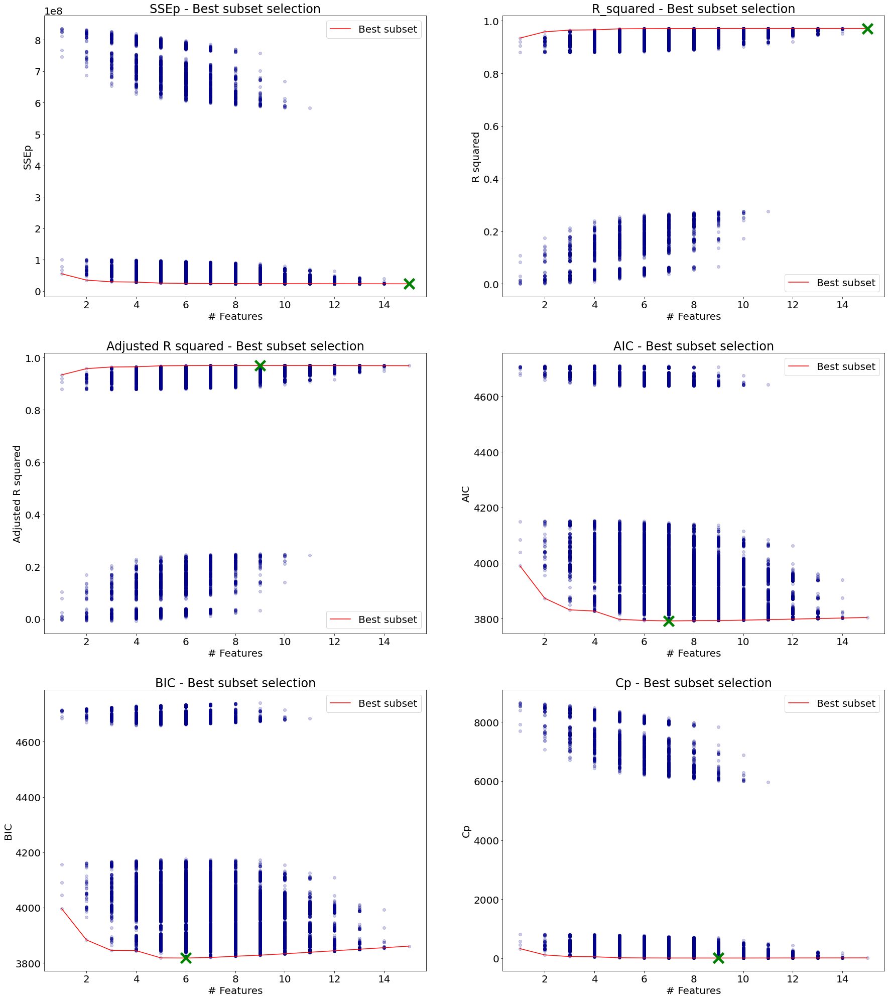

In [191]:
## Plots for variable selection criteria
fig = plt.figure(figsize = (30,35))
ax = fig.add_subplot(3, 2, 1)
plt.rcParams['font.size'] = '20'

ax.scatter(Subset_df.p,Subset_df.SSEp, alpha = .2, color = 'darkblue' )
ax.set_xlabel('# Features')
ax.set_ylabel('SSEp')
ax.set_title('SSEp - Best subset selection')
ax.plot(range(1,16),Best_subset['min_SSEp']['SSEp'],color = 'r', label = 'Best subset')
ax.plot(Best_subset['min_SSEp'].loc[Best_subset['min_SSEp']['SSEp'].idxmin()]['p'],Best_subset['min_SSEp']['SSEp'].min(), marker = 'x', markersize = 20, color= 'green',markeredgewidth = 5)
ax.legend()

ax = fig.add_subplot(3, 2, 2)
ax.scatter(Subset_df.p,Subset_df.R_squared, alpha = .2, color = 'darkblue' )
ax.plot(range(1,16),Best_subset['max_R2']['R_squared'],color = 'r', label = 'Best subset')
ax.plot(Best_subset['max_R2'].loc[Best_subset['max_R2']['R_squared'].idxmax()]['p'],Best_subset['max_R2']['R_squared'].max(), marker = 'x', markersize = 20, color= 'green',markeredgewidth = 5)
ax.set_xlabel('# Features')
ax.set_ylabel('R squared')
ax.set_title('R_squared - Best subset selection')
ax.legend()

ax = fig.add_subplot(3, 2, 3)
ax.scatter(Subset_df.p,Subset_df.Adj_R_squared, alpha = .2, color = 'darkblue' )
ax.set_xlabel('# Features')
ax.set_ylabel('Adjusted R squared')
ax.set_title('Adjusted R squared - Best subset selection')
ax.plot(range(1,16),Best_subset['max_adj_R2']['Adj_R_squared'],color = 'r', label = 'Best subset')
ax.plot(Best_subset['max_adj_R2'].loc[Best_subset['max_adj_R2']['Adj_R_squared'].idxmax()]['p'],Best_subset['max_adj_R2']['Adj_R_squared'].max(), marker = 'x', markersize = 20, color= 'green',markeredgewidth = 5)
ax.legend()

ax = fig.add_subplot(3, 2, 4)
ax.scatter(Subset_df.p,Subset_df.AIC, alpha = .2, color = 'darkblue')
ax.plot(range(1,16),Best_subset['min_AIC']['AIC'],color = 'r', label = 'Best subset')
ax.plot(Best_subset['min_AIC'].loc[Best_subset['min_AIC']['AIC'].idxmin()]['p'],Best_subset['min_AIC']['AIC'].min(), marker = 'x', markersize = 20, color= 'green',markeredgewidth = 5)
ax.set_xlabel('# Features')
ax.set_ylabel('AIC')
ax.set_title('AIC - Best subset selection')
ax.legend()

ax = fig.add_subplot(3, 2, 5)
ax.scatter(Subset_df.p,Subset_df.BIC, alpha = .2, color = 'darkblue')
ax.set_xlabel('# Features')
ax.set_ylabel('BIC')
ax.set_title('BIC - Best subset selection')
ax.plot(range(1,16),Best_subset['min_BIC']['BIC'],color = 'r', label = 'Best subset')
ax.plot(Best_subset['min_BIC'].loc[Best_subset['min_BIC']['BIC'].idxmin()]['p'],Best_subset['min_BIC']['BIC'].min(), marker = 'x', markersize = 20, color= 'green',markeredgewidth = 5)
ax.legend()

ax = fig.add_subplot(3, 2, 6)
ax.scatter(Subset_df.p,Subset_df.Cp, alpha = .2, color = 'darkblue' )
ax.plot(range(1,16),Best_subset['min_Cp']['Cp'],color = 'r', label = 'Best subset')
ax.plot(Best_subset['min_Cp'].loc[Best_subset['min_Cp']['Cp'].idxmin()]['p'],Best_subset['min_Cp']['Cp'].min(), marker = 'x', markersize = 20, color= 'green',markeredgewidth = 5)
ax.set_xlabel('# Features')
ax.set_ylabel('Cp')
ax.set_title('Cp - Best subset selection')
ax.legend()

plt.show()

In [198]:
prams = ['R_squared', 'Adj_R_squared', 'AIC', 'BIC', 'Cp']
value = []
num_var = []
variables = []

for cols in prams:
    if cols == 'R_squared' or cols == 'Adj_R_squared':
        value.append(max(Best_subset['min_SSEp'][cols]))
        num_var.append(Best_subset['min_SSEp'].loc[Best_subset['min_SSEp'][cols].idxmax()]['p'])
        variables.append(Best_subset['min_SSEp'].loc[Best_subset['min_SSEp'][cols].idxmax()]['features'])
    else:
        value.append(min(Best_subset['min_SSEp'][cols]))
        num_var.append(Best_subset['min_SSEp'].loc[Best_subset['min_SSEp'][cols].idxmin()]['p'])
        variables.append(Best_subset['min_SSEp'].loc[Best_subset['min_SSEp'][cols].idxmin()]['features'])
    
subsets_df = pd.DataFrame({'Parameter':prams, 'Value':value, 'p': num_var, 'Features':variables})    

In [199]:
subsets_df

,Parameter,Value,p,Features
0,R_squared,0.970625,15,"(x3, x4, x5, x6, x7, x8, x9, x10, x11, x12, x1..."
1,Adj_R_squared,0.969483,9,"(x4, x7, x8, x9, x10, x11, x13, x14, x15_4)"
2,AIC,3791.250271,7,"(x4, x7, x8, x10, x13, x14, x15_4)"
3,BIC,3817.915762,6,"(x4, x7, x10, x13, x14, x15_4)"
4,Cp,8.847623,9,"(x4, x7, x8, x9, x10, x11, x13, x14, x15_4)"


#### Stepwise feature selection

In [247]:

    X = X_train1
    y = y_train1


    def stepwise_selection(X, y, 
                           initial_list=[], 
                           threshold_in=0.05, 
                           threshold_out = 0.05, 
                           verbose=True):
        """ Perform a forward-backward feature selection 
        based on p-value from statsmodels.api.OLS
        Arguments:
            X - pandas.DataFrame with candidate features
            y - list-like with the target
            initial_list - list of features to start with (column names of X)
            threshold_in - include a feature if its p-value < threshold_in
            threshold_out - exclude a feature if its p-value > threshold_out
            verbose - whether to print the sequence of inclusions and exclusions
        Returns: list of selected features 
        Always set threshold_in < threshold_out to avoid infinite looping.
        See https://en.wikipedia.org/wiki/Stepwise_regression for the details
        """
        included = list(initial_list)
        while True:
            changed=False
            # forward step
            excluded = list(set(X.columns)-set(included))
            new_pval = pd.Series(index=excluded)
            for new_column in excluded:
                model = sm.OLS(y,(pd.DataFrame(X[included+[new_column]]))).fit()
                new_pval[new_column] = model.pvalues[new_column]
            best_pval = new_pval.min()
            if best_pval < threshold_in:
                best_feature = new_pval.idxmin()
                included.append(best_feature)
                changed=True
                if verbose:
                    print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

            # backward step
            model = sm.OLS(y,(pd.DataFrame(X[included]))).fit()
            # use all coefs except intercept
            pvalues = model.pvalues.iloc[1:]
            worst_pval = pvalues.max() # null if pvalues is empty
            if worst_pval > threshold_out:
                changed=True
                worst_feature = pvalues.idxmax()
                included.remove(worst_feature)
                if verbose:
                    print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
            if not changed:
                break
        return included

    result = stepwise_selection(X, y)

    print('resulting features:')
    print(result)


/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/717792600.py:28: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/717792600.py:28: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/717792600.py:28: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/717792600.py:28: FutureWarning: The default dtype for empty Series will be 'object' inste

Add  x14                            with p-value 1.78434e-169
Add  x7                             with p-value 2.79368e-22
Add  x12                            with p-value 6.02882e-10
Add  x4                             with p-value 6.05042e-06
Add  x11                            with p-value 0.0019383
Add  x15_4                          with p-value 0.00622727
Add  x6                             with p-value 0.0437569
Add  x10                            with p-value 0.00916417
Add  x13                            with p-value 1.78437e-06
Drop x12                            with p-value 0.859233
Add  x8                             with p-value 0.0491447
Drop x6                             with p-value 0.909464
Drop x11                            with p-value 0.170718
Drop x8                             with p-value 0.0557587
resulting features:
['x14', 'x7', 'x4', 'x15_4', 'x10', 'x13']


/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/717792600.py:28: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/717792600.py:28: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


In [299]:
#fit simple linear regression model
X_sw = X_train1[['x14', 'x7', 'x4', 'x15_4', 'x10', 'x13']]
Y_sw = y_train1
model_sw = sm.OLS(Y_sw, X_sw).fit()
pred_sw = model_sw.predict(X_sw)
residuals_sw = Y_sw - model_sw.predict(X_sw)
summary_sw = model_sw.summary()
print(summary_sw)

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.976
Model:                            OLS   Adj. R-squared (uncentered):              0.975
Method:                 Least Squares   F-statistic:                              1714.
Date:                Tue, 25 Apr 2023   Prob (F-statistic):                   1.13e-204
Time:                        20:47:35   Log-Likelihood:                         -1892.0
No. Observations:                 264   AIC:                                      3796.
Df Residuals:                     258   BIC:                                      3817.
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [414]:
residuals_sw.index = range(1,265)

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


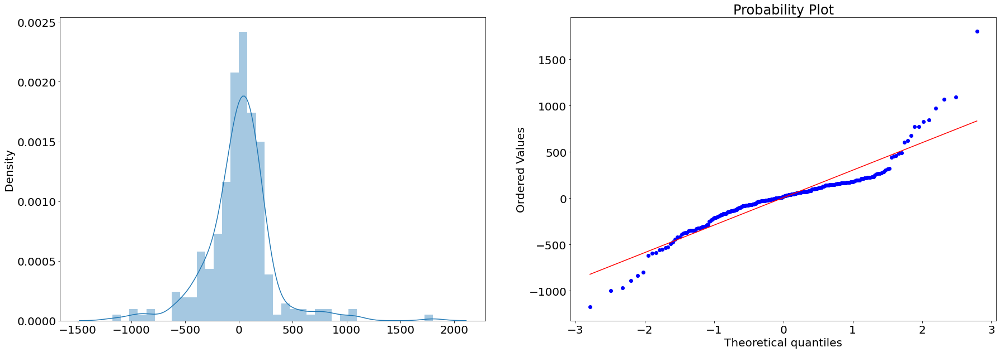

Text(0.5, 1.0, 'Residual plot')

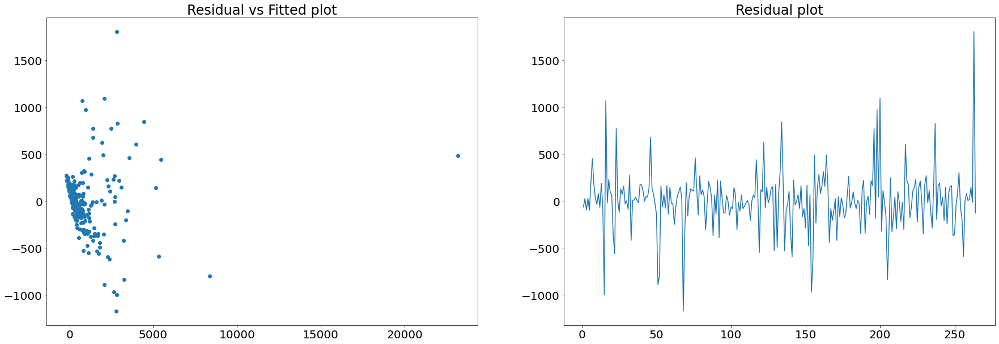

In [415]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals_sw, ax = ax1)
plt.title("Residual density plot")

sp.stats.probplot(residuals_sw,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred_sw,residuals_sw)
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals_sw)
plt.title("Residual plot")

In [258]:
from scipy.stats import kstest
kstest(residuals_sw, 'norm')

KstestResult(statistic=0.533594880611779, pvalue=9.715027245135456e-71)

In [259]:
from statsmodels.compat import lzip
import statsmodels.stats.api as sms

#perform Bresuch-Pagan test
names = ['Lagrange multiplier statistic', 'p-value',
        'f-value', 'f p-value']
test = sms.het_breuschpagan(model_sw.resid, model_sw.model.exog)

lzip(names, test)

[('Lagrange multiplier statistic', 89.12568427902619),
 ('p-value', 1.025560914415055e-17),
 ('f-value', 21.915193252924798),
 ('f p-value', 8.410851070885296e-21)]

#### Added variable plot

eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1
eval_env: 1


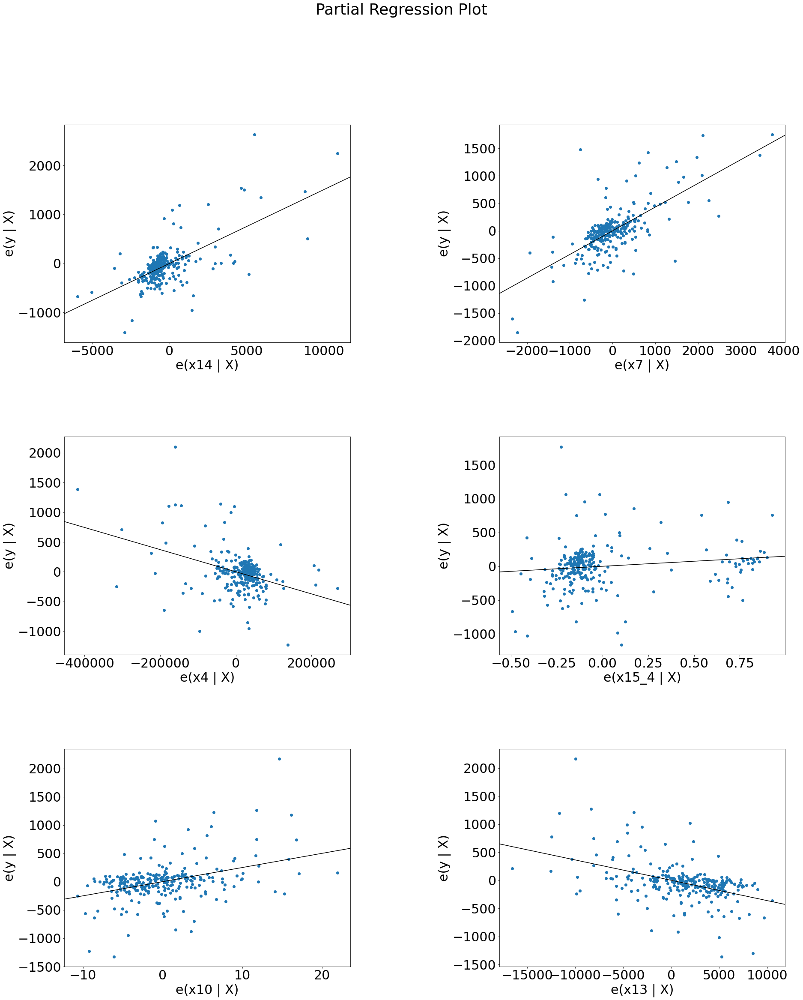

In [260]:
fig = plt.figure(figsize = (30,35))
plt.rcParams['font.size'] = '30'
sm.graphics.plot_partregress_grid(model_sw, fig =fig)
fig.tight_layout(pad=5)

#### Regression diagnostics for x14

eval_env: 1


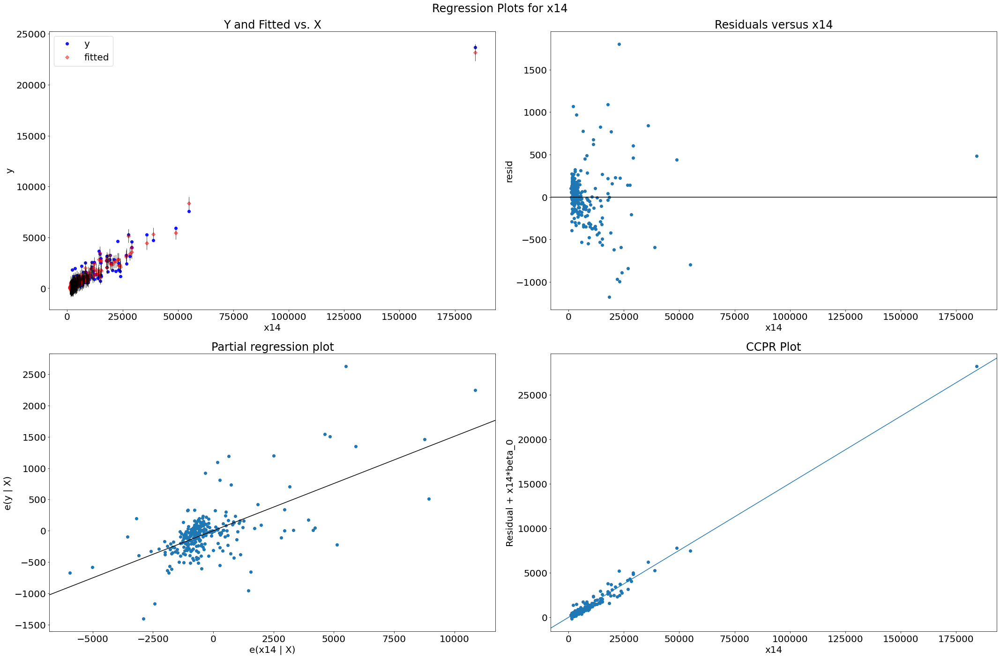

In [265]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '20'
sm.graphics.plot_regress_exog(model_sw, "x14", fig = fig)
fig.tight_layout(pad=1.0)

#### Regression diagnostics for x7

eval_env: 1


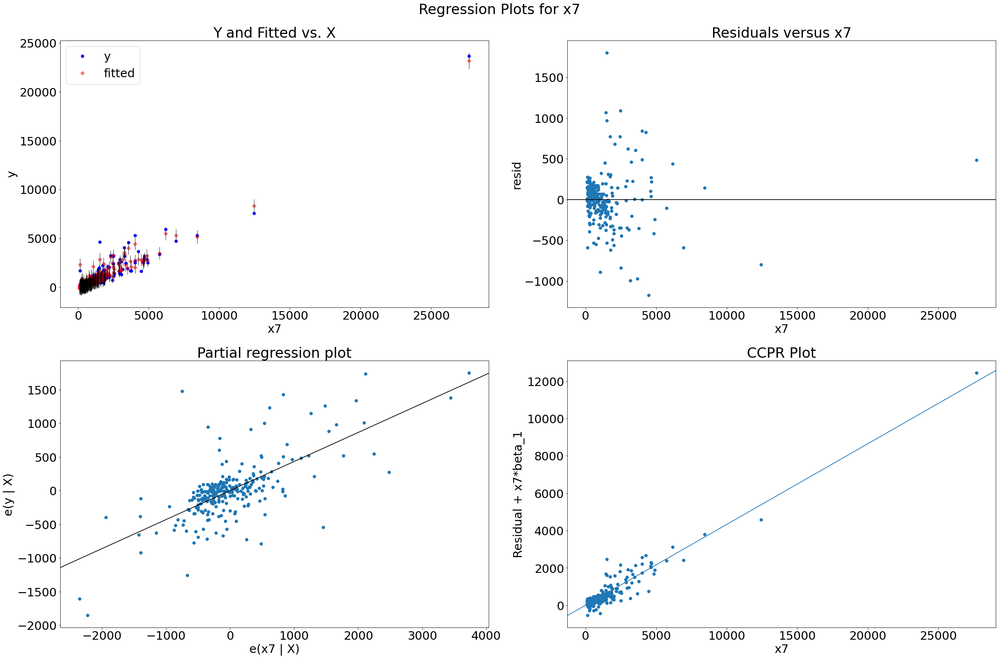

In [275]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '25'
sm.graphics.plot_regress_exog(model_sw, "x7", fig = fig)
fig.tight_layout(pad=1.0)

#### Regression diagnostics for x4

eval_env: 1


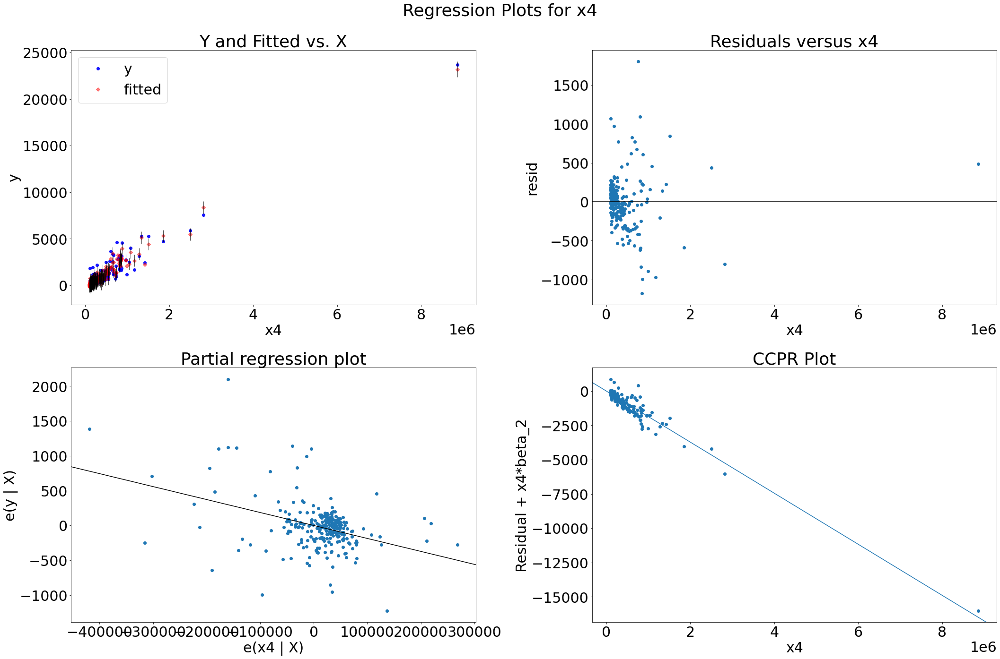

In [274]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '30'
sm.graphics.plot_regress_exog(model_sw, "x4", fig = fig)
fig.tight_layout(pad=1.0)

#### Regression diagnostics for x15_4

eval_env: 1


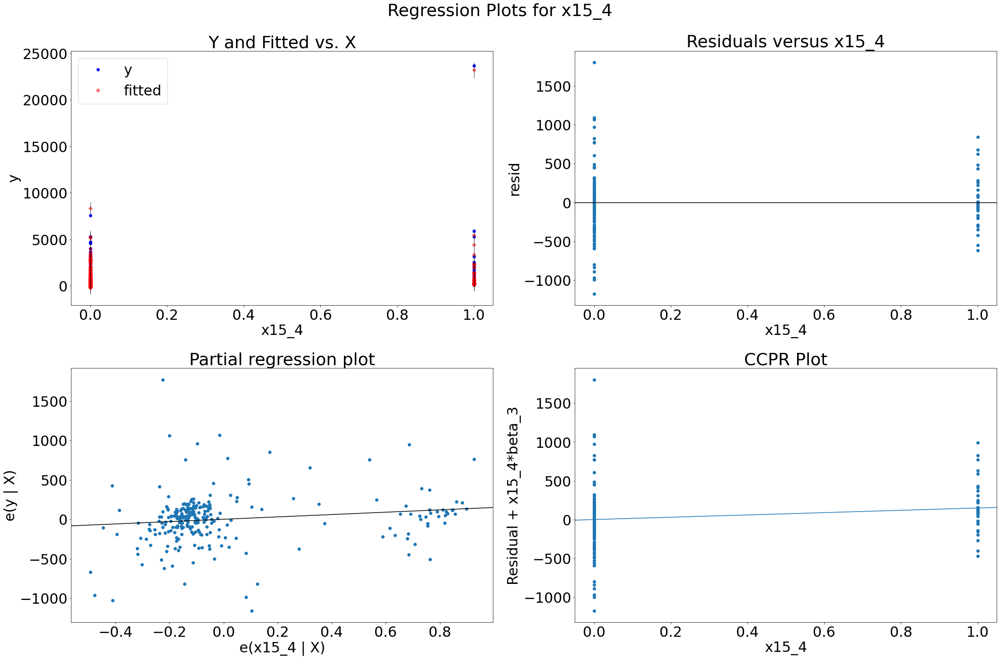

In [273]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '30'
sm.graphics.plot_regress_exog(model_sw, "x15_4", fig = fig)
fig.tight_layout(pad=1.0)

#### Regression diagnostics for x10

eval_env: 1


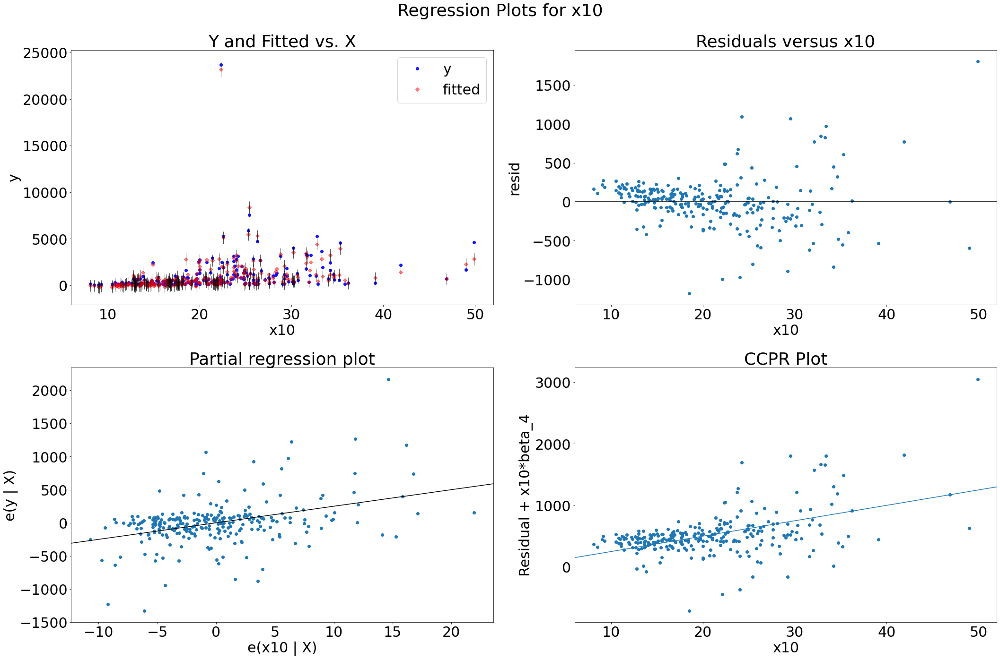

In [270]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '30'
sm.graphics.plot_regress_exog(model_sw, "x10", fig = fig)
fig.tight_layout(pad=1.0)

#### Regression diagnostics for x13

eval_env: 1


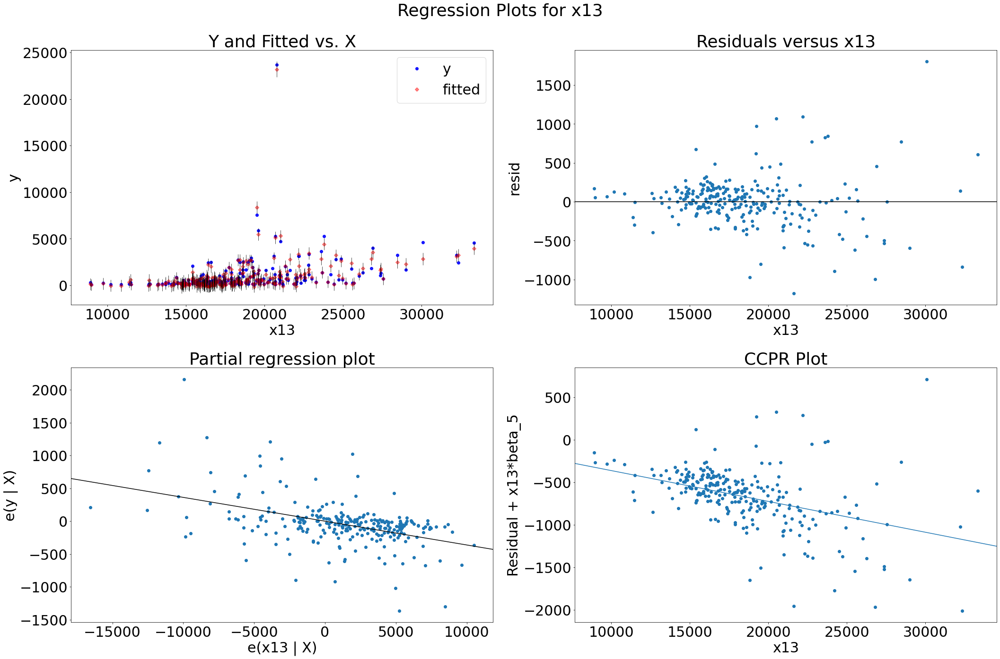

In [272]:
fig = plt.figure(figsize = (30,20))
plt.rcParams['font.size'] = '30'
sm.graphics.plot_regress_exog(model_sw, "x13", fig = fig)
fig.tight_layout(pad=1.0)

#### Checking for possible interaction terms

In [578]:
final1_X = final1_df.drop(['y'], axis=1)

In [579]:
## Standardized variables
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
final1_standardized = pd.DataFrame(scaler.fit_transform(final1_X.drop(['x15_4'], axis=1)), columns= final1_X.drop(['x15_4'],axis=1).columns)

for cols in final1_standardized.columns:
    final1_standardized[cols] = final1_standardized[cols]/np.sqrt(final1_X.shape[0]-1)

In [580]:
final1_standardized['x15_4'] = list(final1_X['x15_4'])
final1_standardized

,x14,x7,x4,x10,x13,x15_4
0,-0.014232,-0.020239,-0.009070,0.011729,-0.043004,1
1,-0.026251,-0.020267,-0.024970,-0.060633,-0.051295,0
2,-0.002207,-0.007995,0.002327,-0.003417,-0.011881,0
3,-0.022497,-0.016233,-0.021994,-0.008465,-0.014365,0
4,-0.001308,0.013169,0.005419,-0.067365,-0.025156,0
...,...,...,...,...,...,...
259,-0.024775,-0.020267,-0.022918,-0.055585,-0.050978,0
260,-0.013282,-0.012966,-0.012016,-0.034549,-0.000679,0
261,0.002981,0.043252,0.004042,0.034447,0.019147,0
262,0.070312,0.003993,0.037488,0.244803,0.184523,0


In [581]:
## Adding interaction terms
for col1 in X_sw.columns:
    for col2 in X_sw.columns:
        if col1 == col2:
            if col1+"^2" not in final1_standardized.columns and col2+"^2" not in final1_standardized.columns and col1 != 'x15_4':
                final1_standardized[col1+"^2"] = np.square(final1_standardized[col1])
        else:
            if col1+"*"+col2 not in final1_standardized.columns and col2+"*"+col1 not in final1_standardized.columns:
                final1_standardized[col1+"*"+col2] = final1_standardized[col1]*final1_standardized[col2]

In [582]:
final1_standardized

,x14,x7,x4,x10,x13,x15_4,x14^2,x14*x7,x14*x4,x14*x15_4,...,x7*x13,x4^2,x4*x15_4,x4*x10,x4*x13,x15_4*x10,x15_4*x13,x10^2,x10*x13,x13^2
0,-0.014232,-0.020239,-0.009070,0.011729,-0.043004,1,0.000203,2.880279e-04,0.000129,-0.014232,...,0.000870,0.000082,-0.00907,-0.000106,0.000390,0.011729,-0.043004,0.000138,-0.000504,1.849306e-03
1,-0.026251,-0.020267,-0.024970,-0.060633,-0.051295,0,0.000689,5.320336e-04,0.000655,-0.000000,...,0.001040,0.000623,-0.00000,0.001514,0.001281,-0.000000,-0.000000,0.003676,0.003110,2.631126e-03
2,-0.002207,-0.007995,0.002327,-0.003417,-0.011881,0,0.000005,1.764794e-05,-0.000005,-0.000000,...,0.000095,0.000005,0.00000,-0.000008,-0.000028,-0.000000,-0.000000,0.000012,0.000041,1.411544e-04
3,-0.022497,-0.016233,-0.021994,-0.008465,-0.014365,0,0.000506,3.651937e-04,0.000495,-0.000000,...,0.000233,0.000484,-0.00000,0.000186,0.000316,-0.000000,-0.000000,0.000072,0.000122,2.063522e-04
4,-0.001308,0.013169,0.005419,-0.067365,-0.025156,0,0.000002,-1.722475e-05,-0.000007,-0.000000,...,-0.000331,0.000029,0.00000,-0.000365,-0.000136,-0.000000,-0.000000,0.004538,0.001695,6.328172e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
259,-0.024775,-0.020267,-0.022918,-0.055585,-0.050978,0,0.000614,5.021209e-04,0.000568,-0.000000,...,0.001033,0.000525,-0.00000,0.001274,0.001168,-0.000000,-0.000000,0.003090,0.002834,2.598762e-03
260,-0.013282,-0.012966,-0.012016,-0.034549,-0.000679,0,0.000176,1.722110e-04,0.000160,-0.000000,...,0.000009,0.000144,-0.00000,0.000415,0.000008,-0.000000,-0.000000,0.001194,0.000023,4.604522e-07
261,0.002981,0.043252,0.004042,0.034447,0.019147,0,0.000009,1.289537e-04,0.000012,0.000000,...,0.000828,0.000016,0.00000,0.000139,0.000077,0.000000,0.000000,0.001187,0.000660,3.666050e-04
262,0.070312,0.003993,0.037488,0.244803,0.184523,0,0.004944,2.807608e-04,0.002636,0.000000,...,0.000737,0.001405,0.00000,0.009177,0.006917,0.000000,0.000000,0.059928,0.045172,3.404871e-02


In [639]:
Y_stanadrdized = (scaler.fit_transform(pd.DataFrame(Y_sw))/np.sqrt(len(Y_sw)-1))

In [640]:
Y_stanadrdized = Y_stanadrdized.reshape((264,))

In [585]:
model_itr = sm.OLS(Y_stanadrdized, final1_standardized).fit()
pred_itr = model_itr.predict(final1_standardized)
residuals_itr = Y_stanadrdized - model_itr.predict(final1_standardized)
summary_itr = model_itr.summary()
print(summary_itr)

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.983
Model:                            OLS   Adj. R-squared (uncentered):              0.982
Method:                 Least Squares   F-statistic:                              545.2
Date:                Wed, 26 Apr 2023   Prob (F-statistic):                   2.15e-196
Time:                        00:30:00   Log-Likelihood:                          902.61
No. Observations:                 264   AIC:                                     -1753.
Df Residuals:                     238   BIC:                                     -1660.
Df Model:                          26                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [586]:
attributes =[]
pval = []
for attribute in final1_standardized.columns:
    if model_itr.pvalues[attribute] > 0.05 and attribute not in X_sw.columns:
        attributes.append(attribute)
        pval.append(model_itr.pvalues[attribute])

In [587]:
itr_tab = pd.DataFrame({"Attribute":attributes, "p-value":pval})
itr_tab

,Attribute,p-value
0,x14^2,0.181655
1,x14*x7,0.984458
2,x14*x4,0.256148
3,x14*x13,0.083465
4,x7^2,0.095001
5,x7*x4,0.737982
6,x7*x15_4,0.252770
7,x7*x13,0.427728
8,x4^2,0.449501
9,x4*x13,0.378983


In [588]:

    def stepwise_selection(X, y, 
                           initial_list=[], 
                           threshold_in=0.05, 
                           threshold_out = 0.05, 
                           verbose=True):
        """ Perform a forward-backward feature selection 
        based on p-value from statsmodels.api.OLS
        Arguments:
            X - pandas.DataFrame with candidate features
            y - list-like with the target
            initial_list - list of features to start with (column names of X)
            threshold_in - include a feature if its p-value < threshold_in
            threshold_out - exclude a feature if its p-value > threshold_out
            verbose - whether to print the sequence of inclusions and exclusions
        Returns: list of selected features 
        Always set threshold_in < threshold_out to avoid infinite looping.
        See https://en.wikipedia.org/wiki/Stepwise_regression for the details
        """
        included = list(initial_list)
        while True:
            changed=False
            # forward step
            excluded = list(set(X.columns)-set(included))
            new_pval = pd.Series(index=excluded)
            for new_column in excluded:
                model = sm.OLS(y,(pd.DataFrame(X[included+[new_column]]))).fit()
                new_pval[new_column] = model.pvalues[new_column]
            best_pval = new_pval.min()
            if best_pval < threshold_in:
                best_feature = new_pval.idxmin()
                included.append(best_feature)
                changed=True
                if verbose:
                    print('Add  {:30} with p-value {:.6}'.format(best_feature, best_pval))

            # backward step
            model = sm.OLS(y,(pd.DataFrame(X[included]))).fit()
            # use all coefs except intercept
            pvalues = model.pvalues.iloc[1:]
            worst_pval = pvalues.max() # null if pvalues is empty
            if worst_pval > threshold_out:
                changed=True
                worst_feature = pvalues.idxmax()
                included.remove(worst_feature)
                if verbose:
                    print('Drop {:30} with p-value {:.6}'.format(worst_feature, worst_pval))
            if not changed:
                break
        return included

    result = stepwise_selection(final1_standardized, Y_stanadrdized)

    print('resulting features:')
    print(result)


/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2524523610.py:24: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2524523610.py:24: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2524523610.py:24: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2524523610.py:24: FutureWarning: The default dtype for empty Series will be 'object' i

Add  x14                            with p-value 3.10522e-157
Add  x7                             with p-value 2.10843e-27
Add  x10                            with p-value 5.54576e-11
Add  x7*x10                         with p-value 2.47545e-10
Add  x7*x15_4                       with p-value 1.4982e-09
Add  x14*x10                        with p-value 0.00108872


/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2524523610.py:24: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2524523610.py:24: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2524523610.py:24: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2524523610.py:24: FutureWarning: The default dtype for empty Series will be 'object' i

Add  x4*x10                         with p-value 0.000130729
Add  x13^2                          with p-value 9.58395e-07
Add  x13                            with p-value 0.00421054
Add  x4                             with p-value 0.00279119
Add  x15_4                          with p-value 0.00115684
Add  x4*x13                         with p-value 4.28024e-07
resulting features:
['x14', 'x7', 'x10', 'x7*x10', 'x7*x15_4', 'x14*x10', 'x4*x10', 'x13^2', 'x13', 'x4', 'x15_4', 'x4*x13']


/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2524523610.py:24: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)
/var/folders/j4/rz_vddh97qx2fg3073flhykw0000gn/T/ipykernel_99352/2524523610.py:24: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=excluded)


In [710]:
final_features = ['x4', 'x7', 'x10', 'x13', 'x14', 'x15_4', 'x13^2', 'x4*x10', 'x4*x13', 'x7*x10', 'x7*x15_4', 'x14*x10']

In [711]:
## These are the final model features with interaction terms
final_features

['x4',
 'x7',
 'x10',
 'x13',
 'x14',
 'x15_4',
 'x13^2',
 'x4*x10',
 'x4*x13',
 'x7*x10',
 'x7*x15_4',
 'x14*x10']

In [591]:
model_itr2 = sm.OLS(Y_stanadrdized, final1_standardized[final_features]).fit()
pred_itr2 = model_itr2.predict(final1_standardized[final_features])
residuals_itr2 = Y_stanadrdized - model_itr2.predict(final1_standardized[final_features])
summary_itr2 = model_itr2.summary()
print(summary_itr2)

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.982
Model:                            OLS   Adj. R-squared (uncentered):              0.981
Method:                 Least Squares   F-statistic:                              1162.
Date:                Wed, 26 Apr 2023   Prob (F-statistic):                   6.68e-213
Time:                        00:30:13   Log-Likelihood:                          893.09
No. Observations:                 264   AIC:                                     -1762.
Df Residuals:                     252   BIC:                                     -1719.
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


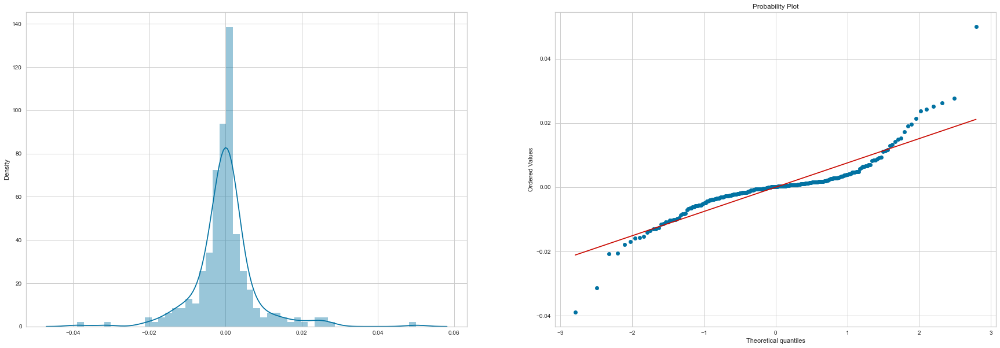

Text(0.5, 1.0, 'Residual plot')

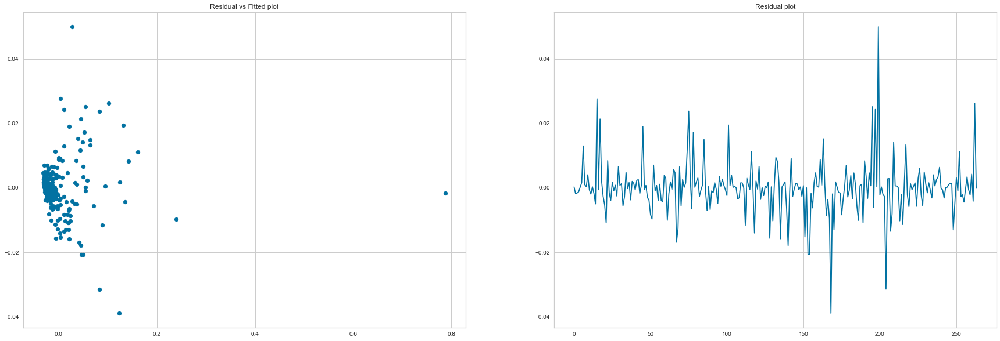

In [592]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals_itr2, ax = ax1)
plt.title("Residual density plot")

sp.stats.probplot(residuals_itr2,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred_itr2,residuals_itr2)
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals_itr2)
plt.title("Residual plot")

This will be our final model

#### Outlier Detetection

In [593]:
import itertools
from itertools import chain, combinations
import statsmodels.formula.api as sm
import scipy.stats as scipystats
import statsmodels.api as sm
import statsmodels.stats.stattools as stools
import statsmodels.stats as stats 
from statsmodels.graphics.regressionplots import *
import copy
from sklearn.model_selection import train_test_split
import math
import time

In [594]:
## Hat matrix daigonal entries
final_model = model_itr2
influence = final_model.get_influence()
h_ii = pd.Series(influence.hat_matrix_diag)

In [595]:
influence = model_itr2.get_influence()
inf_sum = influence.summary_frame()
inf_sum = pd.DataFrame(inf_sum)


student_resid = influence.resid_studentized_external
(cooks, p) = influence.cooks_distance
(dffits, p) = influence.dffits
leverage = influence.hat_matrix_diag
inf_sum = inf_sum[['standard_resid', 'student_resid', 'hat_diag', 'cooks_d', 'dffits_internal', 'dffits']]
inf_sum['y'] = list(Y_stanadrdized)
inf_sum

,standard_resid,student_resid,hat_diag,cooks_d,dffits_internal,dffits,y
0,0.034974,0.034905,0.029914,0.000003,0.006142,0.006129,-0.014157
1,-0.220728,-0.220311,0.012092,0.000050,-0.024421,-0.024374,-0.026133
2,-0.190577,-0.190212,0.012516,0.000038,-0.021456,-0.021414,-0.011879
3,-0.149138,-0.148848,0.007389,0.000014,-0.012868,-0.012843,-0.019265
4,0.026072,0.026021,0.029364,0.000002,0.004535,0.004526,-0.007427
...,...,...,...,...,...,...,...
259,-0.260748,-0.260266,0.009865,0.000056,-0.026027,-0.025979,-0.025650
260,0.507467,0.506718,0.008278,0.000179,0.046362,0.046294,-0.013329
261,-0.498251,-0.497507,0.020874,0.000441,-0.072750,-0.072641,0.024016
262,3.975859,4.098593,0.382435,0.815746,3.128729,3.225312,0.128664


Text(0, 0.5, 'Studentized Residuals')

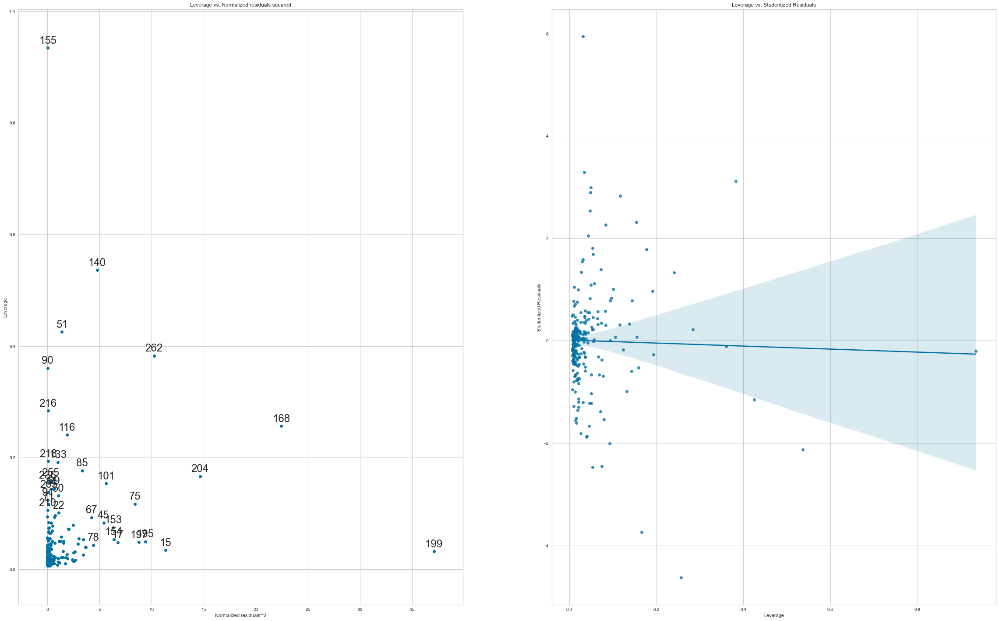

In [596]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40, 25))
plt.rcParams['font.size'] = '20'
plt.rc('axes', labelsize = 40)
plot_leverage_resid2(final_model, ax=ax1)

plt.rcParams['font.size'] = '20'
sns.regplot(x=leverage, y=final_model.resid_pearson, ax=ax2)
plt.title('Leverage vs. Studentized Residuals')
plt.xlabel('Leverage')
plt.ylabel('Studentized Residuals')

In [597]:
r = inf_sum.student_resid
print ('-'*30 + ' studentized residual ' + '-'*30)
print (r.describe())
print ('\n')

r_sort = inf_sum.sort_values(by = 'student_resid')
print ('-'*20 + ' top 5 most negative stundentized residuals ' + '-'*20)
print (r_sort['student_resid'].head())
print ('\n')

print ('-'*20 + ' top 5 most positive studentized residuals ' + '-'*20)
print (r_sort['student_resid'].tail())

------------------------------ studentized residual ------------------------------
count    264.000000
mean      -0.003216
std        1.070715
min       -5.692647
25%       -0.324722
50%        0.021688
75%        0.225365
max        6.527134
Name: student_resid, dtype: float64


-------------------- top 5 most negative stundentized residuals --------------------
168   -5.692647
204   -4.230741
140   -3.185128
153   -2.579173
154   -2.562775
Name: student_resid, dtype: float64


-------------------- top 5 most positive studentized residuals --------------------
75     3.063685
195    3.125724
15     3.416250
262    4.098593
199    6.527134
Name: student_resid, dtype: float64


We can actually identify the outliers by simply running the following formula.  Again, I used the cutoff of 2 as opposed to 3 in some textbooks. The left column contains the index of an observation, while the right value is the inf_sum value of an outlier observation. 

In [598]:
## printing y values which is outlier

print (inf_sum.y[abs(r) > 2])

15     0.031299
17     0.067090
45     0.040963
67     0.024603
75     0.107437
78     0.070024
101    0.150960
140    0.027157
153    0.026570
154    0.029469
168    0.084934
195    0.080413
197    0.035785
199    0.077789
204    0.052111
262    0.128664
Name: y, dtype: float64


Now that we identified outliers, we need to see which observations can be considered to have leverage values. As discussed earlier, the leverage cutoff can be calculated as (2k+2)/n where k is the number of predictors and n is the sample size.  

In [599]:
#Identify high leverage
#point with leverage = (2k+2)/n 
#k = number of predictors (11)
#n = number of observations (506)
# ((2*12)+2)/264 = 0.09848 any numbner higher than this is high leverage
thres_hii= 2*(len(final_features)+1)/len(inf_sum.y)
inf_hii = pd.DataFrame(inf_sum[['y', 'hat_diag']][abs(inf_sum.hat_diag) > thres_hii])
inf_hii

,y,hat_diag
14,0.031954,0.143555
22,0.044207,0.101115
29,-0.007323,0.144537
50,0.009900,0.131650
51,0.229377,0.425400
71,-0.027618,0.116009
75,0.107437,0.117394
85,0.080033,0.177075
90,0.053698,0.360668
91,-0.025443,0.124175


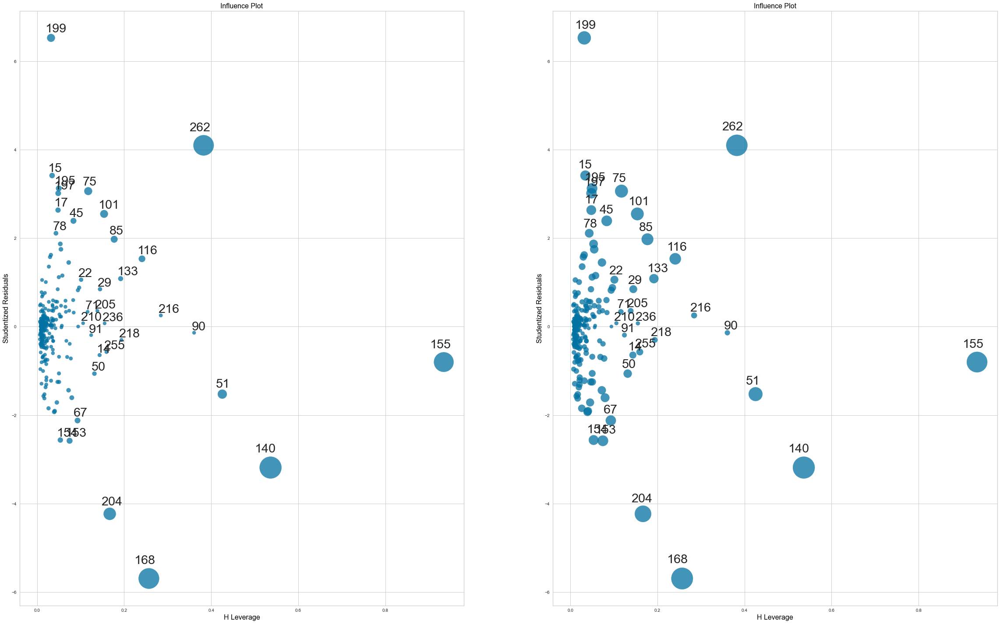

In [600]:
#Plot influential observations by cooks distance
#Use residual squared to restrict the graph but preserve the relative position of observations

from statsmodels.graphics.regressionplots import *
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(40, 25))
plt.rcParams['font.size'] = '20'
plt.rc('figure', titlesize = 30)
influence_plot(final_model, ax=ax1, size=50)


plt.rcParams['font.size'] = '20'
influence_plot(final_model, ax=ax2, size=50, criterion='DFFITS')
plt.show()


In [601]:
## Influential cases by DFFITS
thres_dfts = 2*math.sqrt((len(final_features)+1)/len(inf_sum.y))
inf_dffits = pd.DataFrame(inf_sum[['y','dffits']][abs(inf_sum.dffits) > thres_dfts])
inf_dffits                                 

,y,dffits
15,0.031299,0.645390
17,0.067090,0.591798
45,0.040963,0.721803
51,0.229377,-1.312014
67,0.024603,-0.678711
75,0.107437,1.117336
78,0.070024,0.449323
85,0.080033,0.916479
101,0.150960,1.086519
116,0.172497,0.864028


Text(0.5, 1.0, 'Index Influece plot - DFFITS')

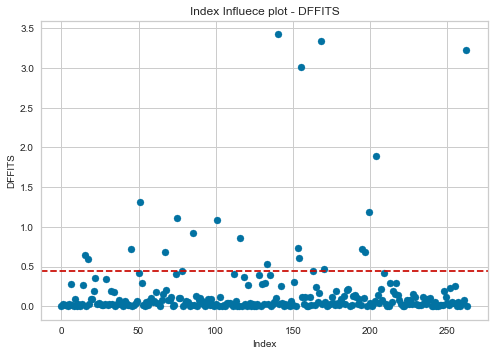

In [833]:
plt.scatter(x= range(0,len(inf_sum.y)), y = abs(inf_sum.dffits))
plt.axhline(y = thres_dfts, color = 'r', linestyle = '--')
plt.rcParams['font.size'] = '50'
plt.xlabel("Index")
plt.ylabel("DFFITS")
plt.title("Index Influece plot - DFFITS")

In [602]:
#Cook's D of more than 3 times the mean is a possible outlier

import scipy
thres_cooks = 3*inf_sum.cooks_d.mean()
inf_cooks=pd.DataFrame((inf_sum[['y', 'cooks_d']][abs(inf_sum.cooks_d) > thres_cooks]))
inf_cooks

,y,cooks_d
51,0.229377,0.142698
75,0.107437,0.100686
85,0.080033,0.069197
101,0.150960,0.096279
116,0.172497,0.061880
140,0.027157,0.943278
155,0.785887,0.758672
168,0.084934,0.829368
199,0.077789,0.100507
204,0.052111,0.279875


Text(0.5, 1.0, 'Index Influece plot')

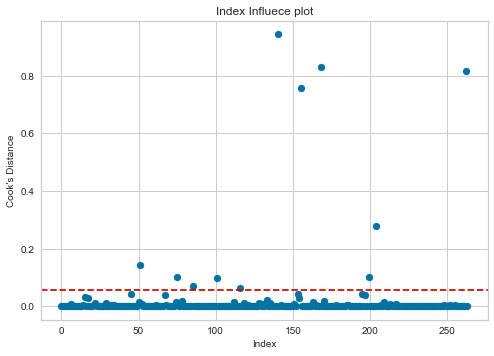

In [610]:
plt.scatter(x= range(0,len(inf_sum.y)), y = inf_sum.cooks_d)
plt.axhline(y = thres_cooks, color = 'r', linestyle = '--')
plt.rcParams['font.size'] = '50'
plt.xlabel("Index")
plt.ylabel("Cook's Distance")
plt.title("Index Influece plot")

#### Removing outliers

In [611]:
X_final = final1_standardized.drop(list(inf_cooks.index), inplace= False)
X_final

,x14,x7,x4,x10,x13,x15_4,x14^2,x14*x7,x14*x4,x14*x15_4,...,x7*x13,x4^2,x4*x15_4,x4*x10,x4*x13,x15_4*x10,x15_4*x13,x10^2,x10*x13,x13^2
0,-0.014232,-0.020239,-0.009070,0.011729,-0.043004,1,0.000203,2.880279e-04,0.000129,-0.014232,...,0.000870,0.000082,-0.00907,-0.000106,0.000390,0.011729,-0.043004,0.000138,-0.000504,1.849306e-03
1,-0.026251,-0.020267,-0.024970,-0.060633,-0.051295,0,0.000689,5.320336e-04,0.000655,-0.000000,...,0.001040,0.000623,-0.00000,0.001514,0.001281,-0.000000,-0.000000,0.003676,0.003110,2.631126e-03
2,-0.002207,-0.007995,0.002327,-0.003417,-0.011881,0,0.000005,1.764794e-05,-0.000005,-0.000000,...,0.000095,0.000005,0.00000,-0.000008,-0.000028,-0.000000,-0.000000,0.000012,0.000041,1.411544e-04
3,-0.022497,-0.016233,-0.021994,-0.008465,-0.014365,0,0.000506,3.651937e-04,0.000495,-0.000000,...,0.000233,0.000484,-0.00000,0.000186,0.000316,-0.000000,-0.000000,0.000072,0.000122,2.063522e-04
4,-0.001308,0.013169,0.005419,-0.067365,-0.025156,0,0.000002,-1.722475e-05,-0.000007,-0.000000,...,-0.000331,0.000029,0.00000,-0.000365,-0.000136,-0.000000,-0.000000,0.004538,0.001695,6.328172e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258,-0.016247,-0.028278,-0.018858,0.001632,0.054368,0,0.000264,4.594370e-04,0.000306,-0.000000,...,-0.001537,0.000356,-0.00000,-0.000031,-0.001025,0.000000,0.000000,0.000003,0.000089,2.955841e-03
259,-0.024775,-0.020267,-0.022918,-0.055585,-0.050978,0,0.000614,5.021209e-04,0.000568,-0.000000,...,0.001033,0.000525,-0.00000,0.001274,0.001168,-0.000000,-0.000000,0.003090,0.002834,2.598762e-03
260,-0.013282,-0.012966,-0.012016,-0.034549,-0.000679,0,0.000176,1.722110e-04,0.000160,-0.000000,...,0.000009,0.000144,-0.00000,0.000415,0.000008,-0.000000,-0.000000,0.001194,0.000023,4.604522e-07
261,0.002981,0.043252,0.004042,0.034447,0.019147,0,0.000009,1.289537e-04,0.000012,0.000000,...,0.000828,0.000016,0.00000,0.000139,0.000077,0.000000,0.000000,0.001187,0.000660,3.666050e-04


In [614]:
Y_final = pd.DataFrame(Y_stanadrdized, columns = ['y'])
Y_final.drop(list(inf_cooks.index), inplace = True)

### Building Final Model

In [615]:
model_final = sm.OLS(Y_final['y'], X_final[final_features]).fit()
pred_final = model_final.predict(X_final[final_features])
residuals_final = Y_final['y'] - model_final.predict(X_final[final_features])
summary_final = model_final.summary()
print(summary_final)

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.957
Model:                            OLS   Adj. R-squared (uncentered):              0.955
Method:                 Least Squares   F-statistic:                              451.2
Date:                Wed, 26 Apr 2023   Prob (F-statistic):                   1.40e-157
Time:                        00:35:27   Log-Likelihood:                          926.19
No. Observations:                 253   AIC:                                     -1828.
Df Residuals:                     241   BIC:                                     -1786.
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


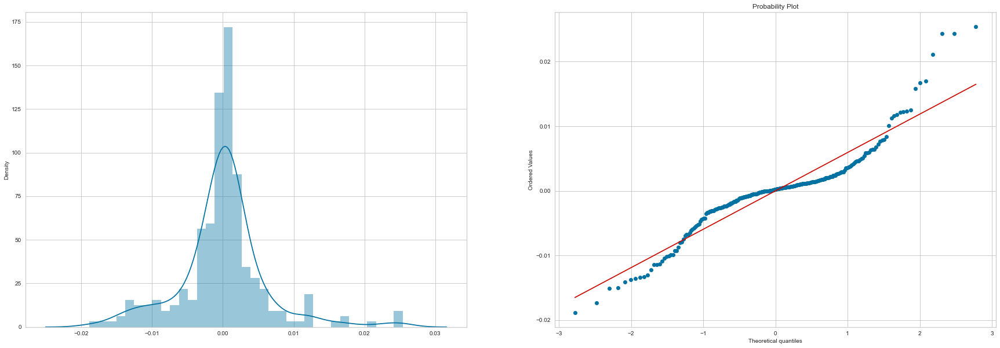

Text(0.5, 1.0, 'Residual plot')

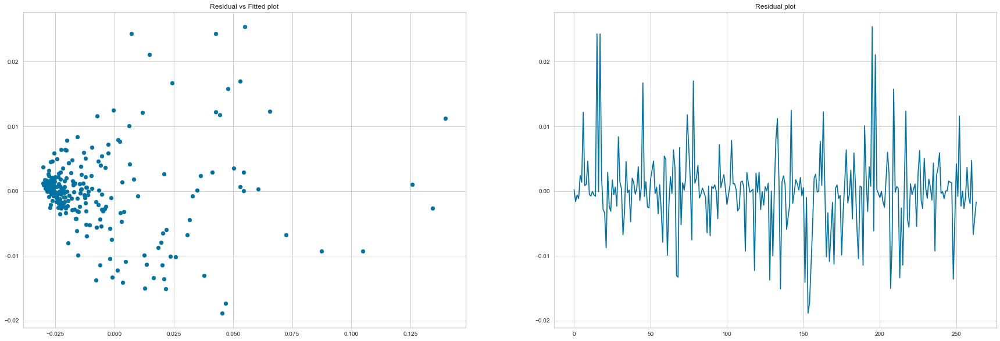

In [617]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals_final, ax = ax1)
plt.title("Residual density plot")

sp.stats.probplot(residuals_final,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred_final,residuals_final)
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals_final)
plt.title("Residual plot")

In [634]:
## weighted least squares
model = sm.OLS(Y_final['y'], X_final[final_features]).fit()
pred = model.predict(X_final[final_features])
abs_residuals = abs(np.array(Y_final['y'] - pred))
    
model2 = sm.OLS(abs_residuals, X_final[final_features]).fit()
pred2 = model2.predict(X_final[final_features])
pred2_sqr = np.array(pred2)**2
weights = 1/np.array(pred2_sqr)

In [642]:
#fit weighted least squares regression model
model_wls = sm.WLS(Y_final['y'], X_final[final_features], weights=weights).fit()
print(model_wls.summary())
pred_wls = model_wls.predict(X_final[final_features])
residuals_wls = Y_final['y'] - model_wls.predict(X_final[final_features])
summary_final = model_final.summary()

                                 WLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   1.000
Model:                            WLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.520e+05
Date:                Wed, 26 Apr 2023   Prob (F-statistic):                        0.00
Time:                        01:38:54   Log-Likelihood:                          1053.5
No. Observations:                 253   AIC:                                     -2083.
Df Residuals:                     241   BIC:                                     -2041.
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


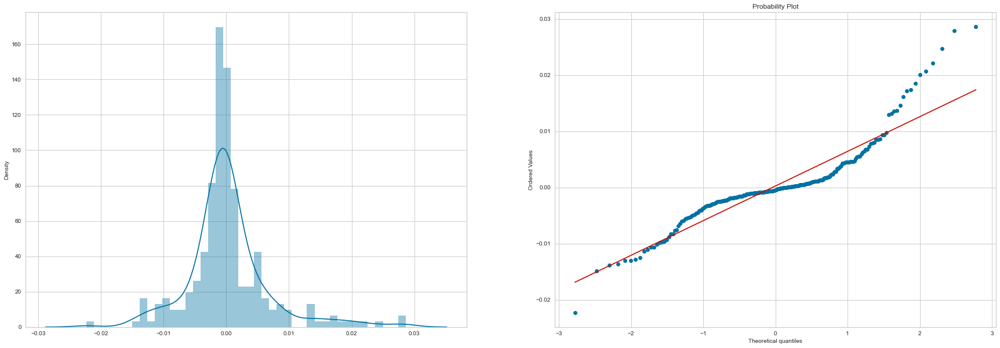

Text(0.5, 1.0, 'Residual plot')

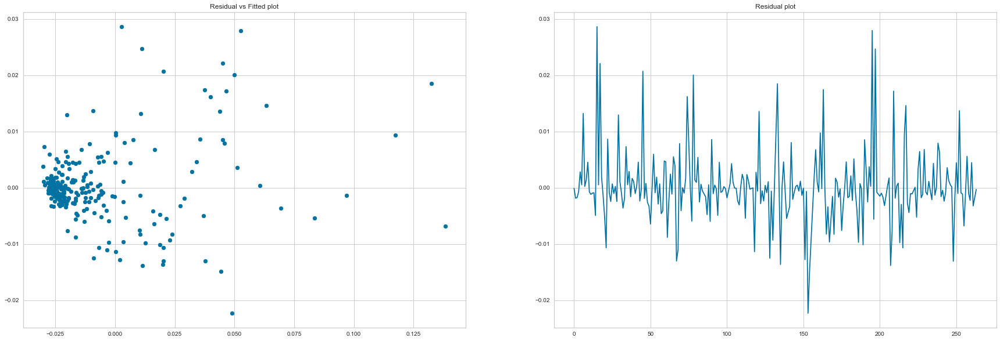

In [643]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 10))
plt.rcParams['font.size'] = '20'
sns.distplot(residuals_wls, ax = ax1)
plt.title("Residual density plot")

sp.stats.probplot(residuals_wls,plot=ax2,fit=True)
plt.show()

plt.subplots(figsize=(30, 10))
plt.rcParams['font.size'] = '20'
plt.subplot(1, 2, 1)
plt.scatter(pred_wls,residuals_wls)
plt.title("Residual vs Fitted plot")

plt.subplot(1, 2, 2)
plt.plot(residuals_wls)
plt.title("Residual plot")

In [655]:
### Weighted least square transformation
wt_sqrt = np.diag(np.sqrt(weights))
Y_wls = np.matmul(wt_sqrt, Y_final)
X_wls = np.matmul(wt_sqrt, X_final)

,x14,x7,x4,x10,x13,x15_4,x14^2,x14*x7,x14*x4,x14*x15_4,...,x7*x13,x4^2,x4*x15_4,x4*x10,x4*x13,x15_4*x10,x15_4*x13,x10^2,x10*x13,x13^2
0,-0.014232,-0.020239,-0.009070,0.011729,-0.043004,1,0.000203,2.880279e-04,0.000129,-0.014232,...,0.000870,0.000082,-0.00907,-0.000106,0.000390,0.011729,-0.043004,0.000138,-0.000504,1.849306e-03
1,-0.026251,-0.020267,-0.024970,-0.060633,-0.051295,0,0.000689,5.320336e-04,0.000655,-0.000000,...,0.001040,0.000623,-0.00000,0.001514,0.001281,-0.000000,-0.000000,0.003676,0.003110,2.631126e-03
2,-0.002207,-0.007995,0.002327,-0.003417,-0.011881,0,0.000005,1.764794e-05,-0.000005,-0.000000,...,0.000095,0.000005,0.00000,-0.000008,-0.000028,-0.000000,-0.000000,0.000012,0.000041,1.411544e-04
3,-0.022497,-0.016233,-0.021994,-0.008465,-0.014365,0,0.000506,3.651937e-04,0.000495,-0.000000,...,0.000233,0.000484,-0.00000,0.000186,0.000316,-0.000000,-0.000000,0.000072,0.000122,2.063522e-04
4,-0.001308,0.013169,0.005419,-0.067365,-0.025156,0,0.000002,-1.722475e-05,-0.000007,-0.000000,...,-0.000331,0.000029,0.00000,-0.000365,-0.000136,-0.000000,-0.000000,0.004538,0.001695,6.328172e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258,-0.016247,-0.028278,-0.018858,0.001632,0.054368,0,0.000264,4.594370e-04,0.000306,-0.000000,...,-0.001537,0.000356,-0.00000,-0.000031,-0.001025,0.000000,0.000000,0.000003,0.000089,2.955841e-03
259,-0.024775,-0.020267,-0.022918,-0.055585,-0.050978,0,0.000614,5.021209e-04,0.000568,-0.000000,...,0.001033,0.000525,-0.00000,0.001274,0.001168,-0.000000,-0.000000,0.003090,0.002834,2.598762e-03
260,-0.013282,-0.012966,-0.012016,-0.034549,-0.000679,0,0.000176,1.722110e-04,0.000160,-0.000000,...,0.000009,0.000144,-0.00000,0.000415,0.000008,-0.000000,-0.000000,0.001194,0.000023,4.604522e-07
261,0.002981,0.043252,0.004042,0.034447,0.019147,0,0.000009,1.289537e-04,0.000012,0.000000,...,0.000828,0.000016,0.00000,0.000139,0.000077,0.000000,0.000000,0.001187,0.000660,3.666050e-04


In [656]:
model_wls = sm.OLS(Y_wls['y'], X_wls[final_features]).fit()
pred_wls = model_wls.predict(X_wls[final_features])
residuals_wls = Y_wls['y'] - model_wls.predict(X_wls[final_features])
summary_wls = model_wls.summary()
print(summary_wls)

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   1.000
Model:                            OLS   Adj. R-squared (uncentered):              1.000
Method:                 Least Squares   F-statistic:                          1.520e+05
Date:                Wed, 26 Apr 2023   Prob (F-statistic):                        0.00
Time:                        01:53:32   Log-Likelihood:                         -439.37
No. Observations:                 253   AIC:                                      902.7
Df Residuals:                     241   BIC:                                      945.1
Df Model:                          12                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

In [653]:
Y_final.shape

(253, 1)

### Multicollinearity Detection

In [795]:
# Function to calculate VIF
def calculate_vif(data):
    vif_df = pd.DataFrame(columns = ['Var', 'Vif'])
    x_var_names = data.columns
    for i in range(0, x_var_names.shape[0]):
        y = data[x_var_names[i]]
        x = data[x_var_names.drop([x_var_names[i]])]
        r_squared = sm.OLS(y,x).fit().rsquared
        vif = round(1/(1-r_squared),2)
        vif_df.loc[i] = [x_var_names[i], vif]
    return vif_df.sort_values(by = 'Vif', axis = 0, ascending=False, inplace=False)

lm = sm.OLS(Y_final['y'], X_final[final_features]).fit()
calculate_vif(X_final[final_features])

,Var,Vif
4,x14,207.36
0,x4,170.78
11,x14*x10,41.08
7,x4*x10,34.61
3,x13,11.38
8,x4*x13,9.62
1,x7,5.04
9,x7*x10,4.35
6,x13^2,4.17
2,x10,2.42


In [826]:
final_features2 = ['x4','x7','x10','x13','x15_4','x13^2','x4*x10','x4*x13','x7*x10','x7*x15_4']

In [827]:
lm = sm.OLS(Y_final['y'], X_final[final_features2]).fit()
calculate_vif(X_final[final_features2])

,Var,Vif
6,x4*x10,5.80
0,x4,5.76
1,x7,4.69
8,x7*x10,4.32
7,x4*x13,4.24
2,x10,2.39
3,x13,2.35
5,x13^2,2.12
9,x7*x15_4,1.53
4,x15_4,1.43


#### Ridge regression

In [659]:
from numpy import arange
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.model_selection import RepeatedKFold

In [661]:
cv = RepeatedKFold(n_splits=10, n_repeats=3, random_state=1)

#define model
model_ridge = RidgeCV(alphas=arange(0.01, 1, 0.01), cv=cv, scoring='neg_mean_absolute_error')

#fit model
model_ridge.fit(X_final, Y_final['y'])

#display lambda that produced the lowest test MSE
print(model_ridge.alpha_)

0.01


In [697]:
mod_coeff = []
lst=np.arange(0,1,0.05)
for i in range(len(lst)):
    model = Ridge(alpha=lst[i])
# fit model
    model.fit(X_final[final_features],Y_final['y'])
# define new data
    model_coeff=model.coef_
    mod_coeff.append(model_coeff)
    

In [698]:
mod_coeff

[array([ 3.93667291e+02,  5.73102270e-01,  1.57345062e-01,  4.97783043e+01,
        -4.54967566e+02,  1.06281271e-02, -2.48723041e-01, -8.58303324e+00,
         1.35121980e+03,  4.73098912e+00,  2.99201764e-01,  7.72765170e+00]),
 array([0.15096375, 0.41356501, 0.08776975, 0.01505496, 0.22055059,
        0.00557148, 0.06173664, 0.03101353, 0.02974817, 0.05002561,
        0.12058129, 0.04020052]),
 array([0.17369825, 0.35085483, 0.08321998, 0.02830072, 0.20594601,
        0.00516797, 0.03358989, 0.01754649, 0.0177141 , 0.02778338,
        0.0873256 , 0.02261144]),
 array([0.17311274, 0.31181299, 0.08013767, 0.03816253, 0.19346036,
        0.00523844, 0.02358891, 0.01278416, 0.01331506, 0.01988182,
        0.07246828, 0.01641285]),
 array([0.16728394, 0.28308495, 0.07785566, 0.04543015, 0.18215887,
        0.00541045, 0.01850193, 0.0102789 , 0.01093868, 0.01573625,
        0.06333968, 0.01317211]),
 array([0.16013422, 0.26036413, 0.07604216, 0.05079013, 0.17201054,
        0.00560148, 0.

In [699]:
Ridge_estimated_params = pd.DataFrame(mod_coeff,columns=final_features)
Ridge_estimated_params.insert(0,'C', lst )
Ridge_estimated_params

,C,x4,x7,x10,x13,x14,x15_4,x13^2,x4*x10,x4*x13,x7*x10,x7*x15_4,x14*x10
0,0.00,393.667291,0.573102,0.157345,49.778304,-454.967566,0.010628,-0.248723,-8.583033,1351.219800,4.730989,0.299202,7.727652
1,0.05,0.150964,0.413565,0.087770,0.015055,0.220551,0.005571,0.061737,0.031014,0.029748,0.050026,0.120581,0.040201
2,0.10,0.173698,0.350855,0.083220,0.028301,0.205946,0.005168,0.033590,0.017546,0.017714,0.027783,0.087326,0.022611
3,0.15,0.173113,0.311813,0.080138,0.038163,0.193460,0.005238,0.023589,0.012784,0.013315,0.019882,0.072468,0.016413
4,0.20,0.167284,0.283085,0.077856,0.045430,0.182159,0.005410,0.018502,0.010279,0.010939,0.015736,0.063340,0.013172
5,0.25,0.160134,0.260364,0.076042,0.050790,0.172011,0.005601,0.015422,0.008699,0.009406,0.013139,0.056866,0.011141
6,0.30,0.152871,0.241657,0.074512,0.054747,0.162918,0.005787,0.013352,0.007593,0.008314,0.011338,0.051902,0.009727
7,0.35,0.145911,0.225847,0.073159,0.057659,0.154755,0.005961,0.011859,0.006766,0.007485,0.010004,0.047909,0.008675
8,0.40,0.139395,0.212237,0.071919,0.059784,0.147400,0.006120,0.010727,0.006119,0.006828,0.008969,0.044594,0.007855
9,0.45,0.133352,0.200353,0.070755,0.061307,0.140745,0.006266,0.009835,0.005596,0.006291,0.008140,0.041777,0.007193


In [726]:
coeff_vif = []
for c in lst:
    model_ridge = Ridge(alpha=c)
    model_ridge.fit(X_final[final_features],Y_final['y'])
    
    temp = list(calculate_vif(X_final[final_features])["Vif"])
    temp.append(model_ridge.score(X_final[final_features],Y_final['y']))
    
    coeff_vif.append(temp)

In [727]:
col_names = final_features.copy()
col_names.append("R2")
coeff_vif_ridge = pd.DataFrame(coeff_vif,columns=col_names)
coeff_vif_ridge.insert(0,'C', lst )
coeff_vif_ridge

,C,x4,x7,x10,x13,x14,x15_4,x13^2,x4*x10,x4*x13,x7*x10,x7*x15_4,x14*x10,R2
0,0.00,207.36,170.78,41.08,34.61,11.38,9.62,5.04,4.35,4.17,2.42,1.87,1.67,0.955001
1,0.05,207.36,170.78,41.08,34.61,11.38,9.62,5.04,4.35,4.17,2.42,1.87,1.67,0.883136
2,0.10,207.36,170.78,41.08,34.61,11.38,9.62,5.04,4.35,4.17,2.42,1.87,1.67,0.862951
3,0.15,207.36,170.78,41.08,34.61,11.38,9.62,5.04,4.35,4.17,2.42,1.87,1.67,0.843061
4,0.20,207.36,170.78,41.08,34.61,11.38,9.62,5.04,4.35,4.17,2.42,1.87,1.67,0.823000
5,0.25,207.36,170.78,41.08,34.61,11.38,9.62,5.04,4.35,4.17,2.42,1.87,1.67,0.803142
6,0.30,207.36,170.78,41.08,34.61,11.38,9.62,5.04,4.35,4.17,2.42,1.87,1.67,0.783775
7,0.35,207.36,170.78,41.08,34.61,11.38,9.62,5.04,4.35,4.17,2.42,1.87,1.67,0.765063
8,0.40,207.36,170.78,41.08,34.61,11.38,9.62,5.04,4.35,4.17,2.42,1.87,1.67,0.747085
9,0.45,207.36,170.78,41.08,34.61,11.38,9.62,5.04,4.35,4.17,2.42,1.87,1.67,0.729867


In [786]:
def vif_ridge(corr_x, pen_factors, is_corr=True):
    """variance inflation factor for Ridge regression

    assumes penalization is on standardized variables
    data should not include a constant

    Parameters
    ----------
    corr_x : array_like
        correlation matrix if is_corr=True or original data if is_corr is False.
    pen_factors : iterable
        iterable of Ridge penalization factors
    is_corr : bool
        Boolean to indicate how corr_x is interpreted, see corr_x

    Returns
    -------
    vif : ndarray
        variance inflation factors for parameters in columns and ridge
        penalization factors in rows

    could be optimized for repeated calculations
    """
    corr_x = np.asarray(corr_x)
    if not is_corr:
        corr = np.corrcoef(corr_x, rowvar=0, bias=True)
    else:
        corr = corr_x
    
    eye = np.eye(corr.shape[1])
    res = []
    for k in pen_factors:
        minv = np.linalg.inv(corr + (k * eye))
        vif = np.matmul(minv,corr)
        vif = np.matmul(vif,minv)
        res.append(np.diag(vif))
    return np.asarray(res)

In [789]:
vif_ridge_coeff = vif_ridge(X_final[final_features].corr(),lst, is_corr=True)

In [793]:
col_names = final_features.copy()

In [794]:
vif_values_ridge = pd.DataFrame(vif_ridge_coeff,columns=col_names)
vif_values_ridge.insert(0,'C', lst )
vif_values_ridge

,C,x4,x7,x10,x13,x14,x15_4,x13^2,x4*x10,x4*x13,x7*x10,x7*x15_4,x14*x10
0,0.00,2.960872e+08,4.836213,2.407076,2.213012e+07,4.426324e+08,1.591848,3.147947,31.859706,1.230466e+07,4.069207,1.655422,36.589057
1,0.05,1.352557e+00,2.435571,1.709254,1.643860e+00,6.967820e-01,1.155913,1.349032,2.563119,2.264160e+00,2.403835,1.259359,2.675397
2,0.10,8.377336e-01,1.556127,1.320118,1.229077e+00,4.535122e-01,0.951274,1.078704,1.180051,1.581208e+00,1.654252,1.052605,1.147587
3,0.15,5.905021e-01,1.121675,1.066183,9.836007e-01,3.318356e-01,0.819937,0.911522,0.753599,1.190095e+00,1.231258,0.907375,0.700028
4,0.20,4.503847e-01,0.868040,0.887228,8.189361e-01,2.605509e-01,0.724273,0.789674,0.549290,9.399959e-01,0.963137,0.796494,0.494651
5,0.25,3.619930e-01,0.703414,0.754683,6.998701e-01,2.143853e-01,0.649627,0.695265,0.430092,7.679759e-01,0.780171,0.708010,0.378992
6,0.30,3.018817e-01,0.588518,0.652943,6.093751e-01,1.823350e-01,0.588885,0.619508,0.352317,6.433703e-01,0.648680,0.635400,0.305703
7,0.35,2.586661e-01,0.504017,0.572681,5.381165e-01,1.589135e-01,0.538063,0.557236,0.297745,5.495454e-01,0.550453,0.574635,0.255527
8,0.40,2.262408e-01,0.439377,0.507964,4.805011e-01,1.411080e-01,0.494693,0.505110,0.257443,4.767375e-01,0.474821,0.523019,0.219229
9,0.45,2.010749e-01,0.388401,0.454834,4.329494e-01,1.271394e-01,0.457134,0.460839,0.226519,4.188589e-01,0.415147,0.478652,0.191862


In [831]:
model_ridge2= Ridge(alpha = 0.01)
model_ridge2.fit(X_final[final_features], Y_final['y'])
pred_ridge2 = model_ridge2.predict(X_final[final_features])
residuals_ridge2 = Y_final['y'] - pred_ridge2
model_ridge2.score(X_final[final_features],Y_final['y'])

0.9104283607681413

In [829]:
X_final

,x14,x7,x4,x10,x13,x15_4,x14^2,x14*x7,x14*x4,x14*x15_4,...,x7*x13,x4^2,x4*x15_4,x4*x10,x4*x13,x15_4*x10,x15_4*x13,x10^2,x10*x13,x13^2
0,-0.014232,-0.020239,-0.009070,0.011729,-0.043004,1,0.000203,2.880279e-04,0.000129,-0.014232,...,0.000870,0.000082,-0.00907,-0.000106,0.000390,0.011729,-0.043004,0.000138,-0.000504,1.849306e-03
1,-0.026251,-0.020267,-0.024970,-0.060633,-0.051295,0,0.000689,5.320336e-04,0.000655,-0.000000,...,0.001040,0.000623,-0.00000,0.001514,0.001281,-0.000000,-0.000000,0.003676,0.003110,2.631126e-03
2,-0.002207,-0.007995,0.002327,-0.003417,-0.011881,0,0.000005,1.764794e-05,-0.000005,-0.000000,...,0.000095,0.000005,0.00000,-0.000008,-0.000028,-0.000000,-0.000000,0.000012,0.000041,1.411544e-04
3,-0.022497,-0.016233,-0.021994,-0.008465,-0.014365,0,0.000506,3.651937e-04,0.000495,-0.000000,...,0.000233,0.000484,-0.00000,0.000186,0.000316,-0.000000,-0.000000,0.000072,0.000122,2.063522e-04
4,-0.001308,0.013169,0.005419,-0.067365,-0.025156,0,0.000002,-1.722475e-05,-0.000007,-0.000000,...,-0.000331,0.000029,0.00000,-0.000365,-0.000136,-0.000000,-0.000000,0.004538,0.001695,6.328172e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258,-0.016247,-0.028278,-0.018858,0.001632,0.054368,0,0.000264,4.594370e-04,0.000306,-0.000000,...,-0.001537,0.000356,-0.00000,-0.000031,-0.001025,0.000000,0.000000,0.000003,0.000089,2.955841e-03
259,-0.024775,-0.020267,-0.022918,-0.055585,-0.050978,0,0.000614,5.021209e-04,0.000568,-0.000000,...,0.001033,0.000525,-0.00000,0.001274,0.001168,-0.000000,-0.000000,0.003090,0.002834,2.598762e-03
260,-0.013282,-0.012966,-0.012016,-0.034549,-0.000679,0,0.000176,1.722110e-04,0.000160,-0.000000,...,0.000009,0.000144,-0.00000,0.000415,0.000008,-0.000000,-0.000000,0.001194,0.000023,4.604522e-07
261,0.002981,0.043252,0.004042,0.034447,0.019147,0,0.000009,1.289537e-04,0.000012,0.000000,...,0.000828,0.000016,0.00000,0.000139,0.000077,0.000000,0.000000,0.001187,0.000660,3.666050e-04


## Model Vallidation 

In [812]:
X_test12 = X_test1.copy()
X_test12

,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,x14,x15_2,x15_3,x15_4
208,1185,228483,25.7,14.3,498,14825,78.7,17.5,9.4,5.7,16022,3661,0,0,1
349,273,128181,27.5,12.6,334,6616,75.1,12.7,7.6,6.4,17338,2222,1,0,0
249,2601,186136,32.1,9.6,409,8921,88.6,32.3,6.6,4.1,17140,3190,0,0,1
319,369,143196,28.4,13.1,235,3409,82.6,28.2,2.6,5.8,24132,3456,0,0,0
54,659,713968,29.0,12.5,3077,43780,80.1,26.3,7.7,4.4,21641,15451,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103,340,462361,27.8,13.0,3021,38194,76.2,17.0,12.0,8.8,17815,8237,1,0,0
253,1044,182201,25.5,8.6,340,9469,75.5,19.4,9.4,5.5,17084,3113,0,1,0
378,581,117206,24.1,14.5,725,6103,76.2,14.8,9.8,8.9,18021,2112,1,0,0
188,802,259462,29.0,11.4,741,9087,79.8,24.8,3.6,5.1,22173,5753,0,0,0


In [ ]:
## Adding interaction terms
for col1 in X_sw.columns:
    for col2 in X_sw.columns:
        if col1 == col2:
            if col1+"^2" not in X_test1.columns and col2+"^2" not in X_test1.columns and col1 != 'x15_4':
                X_test1[col1+"^2"] = np.square(X_test1[col1])
        else:
            if col1+"*"+col2 not in X_test1.columns and col2+"*"+col1 not in X_test1.columns:
                X_test1[col1+"*"+col2] = X_test1[col1]*X_test1[col2]

In [1]:
## Standardized variables
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
Xtest1_standardized = pd.DataFrame(scaler.fit_transform(X_test1[final_features].drop(['x15_4'], axis=1)), columns= X_test1[final_features].drop(['x15_4'],axis=1).columns)

for cols in Xtest1_standardized.columns:
    Xtest1_standardized[cols] = Xtest1_standardized[cols]/np.sqrt(X_test1.shape[0]-1)

NameError: name 'pd' is not defined

In [817]:
Xtest1_standardized['x15_4'] = list(X_test1['x15_4'])
Xtest1_standardized

,x4,x7,x10,x13,x14,x13^2,x4*x10,x4*x13,x7*x10,x7*x15_4,x14*x10,x15_4
0,-0.025895,-0.033995,-0.037358,-0.048733,-0.029581,-0.045034,-0.031337,-0.029583,-0.037084,0.020685,-0.033251,1
1,-0.039485,-0.039068,-0.082259,-0.025441,-0.038598,-0.027699,-0.045010,-0.038596,-0.043420,-0.023138,-0.042165,0
2,-0.031633,-0.036748,0.101084,-0.028945,-0.032533,-0.030394,-0.019722,-0.032531,-0.030716,0.012853,-0.023560,1
3,-0.037451,-0.042131,0.062732,0.094809,-0.030866,0.083550,-0.031108,-0.030869,-0.040042,-0.023138,-0.024947,0
4,0.039882,0.045787,0.044959,0.050720,0.044297,0.038529,0.053905,0.044297,0.065196,-0.023138,0.051868,0
...,...,...,...,...,...,...,...,...,...,...,...,...
171,0.005792,0.044054,-0.042036,-0.016998,-0.000907,-0.021078,-0.009063,-0.000908,0.023315,-0.023138,-0.014361,0
172,-0.032166,-0.038883,-0.019585,-0.029936,-0.033015,-0.031151,-0.034012,-0.033017,-0.040086,-0.023138,-0.034165,0
173,-0.040972,-0.026973,-0.062615,-0.013352,-0.039288,-0.018163,-0.044394,-0.039287,-0.034230,-0.023138,-0.041409,0
174,-0.021698,-0.026478,0.030927,0.060136,-0.016473,0.047732,-0.017285,-0.016473,-0.023399,-0.023138,-0.013703,0


In [821]:
Y_stanadrdized = (scaler.fit_transform(pd.DataFrame(y_test1))/np.sqrt(len(y_test1)-1))

In [818]:
model_ridge = Ridge(alpha=0.01)
model_ridge.fit(X_final[final_features],Y_final['y'])

Ridge(alpha=0.01)

In [ ]:
model_ridge.score(X_final[final_features],Y_final['y'])

In [819]:
yhat = model.predict(Xtest1_standardized)

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)


In [822]:
model.score(Xtest1_standardized,Y_stanadrdized)

/Users/vanshitgosain/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names must be in the same order as they were in fit.

  warnings.warn(message, FutureWarning)


0.5704188867750255